## algo


In [1]:
import cobra as cb
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import copy as cp
from IPython.display import clear_output

In [18]:
# Dynamic Simulation (run through 1 time step split int m_n substeps)
def dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX):
    # count total unique exchange reactions in all models
    N_exs = len(EX)
    dvdt = np.zeros(N_exs)

    flux_results = np.zeros((N_exs, max_substeps, len(models)))
    flux_v_results = np.zeros((N_exs,max_substeps, len(models)))
    vs = np.zeros((N_exs, max_substeps))

    # initialize state vector
    v = np.zeros(N_exs)
    # update media with media fluxes
    dvdt = np.zeros(N_exs)
    for e, flux in media.items():
        ind = EX.index(e)
        dvdt[ind] = -1*flux
    # update state vector with media fluxes
    v = v + dvdt

    # update media with model fluxes
    # loop max_substeps times to smooth dynamics
    for step in range(max_substeps):
        clear_output(wait=False)
        ind_glc = EX.index("EX_glc_D(e)")
        # ind_ser = EX.index("EX_ser_L(e)")
        print('\nStep ' + str(step) + ' of ' + str(max_substeps), f"-------------- Glc: {v[ind_glc]:.4f}")

        vs[:, step] = v #keep track of state vector over time

        v_tmp = v # mmol/ (gt * hr)
        
        for i in range(len(models)):
            dvdt = np.zeros(N_exs)

            m = models[i]
            rel_abund_i = rel_abund[i]
            # turn off all exchanges
            for exch in m.exchanges:
                exch.lower_bound = 0
                exch.upper_bound = 1000

            # set model updtake constraints from media concentrations
            for ind, e in enumerate(EX):
                if e in m.exchanges:
                    # calculate amount of v available to be fluxed
                    # flux_lim = 1000 * v[ind]/rel_abund_i if v[ind] > 0.00001 else 0 # v[ind]/rel_abund_i #step_size if v[ind] > 0 else 0 < works for 2a/b
                    if v[ind] <= 0:
                        flux_lim = 0
                    else:
                        flux_lim = 10000
                    m.exchanges.get_by_id(e).lower_bound = -1*flux_lim
                    # print("Org. ", i+1, ": ", e, "lb: ", flux_lim)
            
            # solve FBA
            sol = m.optimize()
            # print("----")
            # update media with model fluxes
            for exch in m.exchanges:
                e, flux = exch.id, sol.fluxes[exch.id] # internal fluxes
                ind = EX.index(e)
            

                # print("Internal v for org ", i+1, ", exch ", e, ": ", v[ind])
                dvdt[ind] = flux*step_size #rel_abund_i*step_size # mmol / (gt * hr^2) # flux velocity = conc accel

                flux_results[ind, step, i] = flux
                flux_v_results[ind, step, i] = dvdt[ind]

            # update state vector with model fluxes
            v_tmp = v_tmp + dvdt
        if np.all(np.abs(v_tmp - v) < 1e-6):
            print("Converged at step ", step)
            break
        
        v = v_tmp

    return flux_results, flux_v_results, vs

## 1a


In [4]:
import gifba

# load models and media:
sim = "1a"
models, media = gifba.utils.load_simple_models(sim)

# initialize community
community = gifba.gifbaObject(models, media, rel_abund=[1], step_size=0.01)

# run iterations
media_flux, org_flux = community.run_gifba(iters=1000, method="pfba", early_stop=False, v=True)

Set parameter Username
Set parameter LicenseID to value 2684253
Academic license - for non-commercial use only - expires 2026-07-02
Read LP format model from file /tmp/tmp8vkp_2aw.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Iteration: 0
 Simulating model: 1  of  1
Ex_A [-10.]
exchangeBio1 [-0.]
Iteration: 1
 Simulating model: 1  of  1
Ex_A [-9.9]
exchangeBio1 [-0.1]
Iteration: 2
 Simulating model: 1  of  1
Ex_A [-9.801]
exchangeBio1 [-0.199]
Iteration: 3
 Simulating model: 1  of  1
Ex_A [-9.70299]
exchangeBio1 [-0.29701]
Iteration: 4
 Simulating model: 1  of  1
Ex_A [-9.60596]
exchangeBio1 [-0.39404]
Iteration: 5
 Simulating model: 1  of  1
Ex_A [-9.5099]
exchangeBio1 [-0.4901]
Iteration: 6
 Simulating model: 1  of  1
Ex_A [-9.414801]
exchangeBio1 [-0.585199]
Iteration: 7
 Simulating model: 1  of  1
Ex_A [-9.320653]
exchangeBio1 [-0.679347]
Iteration: 8
 Simulating model: 1  of  1
Ex_A [-9.227446]
exchangeBio1 [-0.772554]
Iteration: 9
 Simulating model: 1  of  1
Ex

In [ ]:
# Simulation
rel_abund = [1]
max_substeps = 1000
step_size = 0.01

EX = []
for m in models:
    for exch in m.exchanges:
        EX.append(exch.id)
EX = list(dict.fromkeys(EX))
N_exs = len(EX)
x0 = np.zeros(N_exs)

models = cp.deepcopy(models)

results, sum_results, xs = dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX)

Read LP format model from file /tmp/tmpatbgt8la.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros

Step 0 of 1000 -------------------------

Org.  1 :  Ex_A lb:  10.0
Org.  1 :  exchangeBio1 lb:  0.0
----
Internal v for org  1 , exch  Ex_A :  10.0
Internal v for org  1 , exch  exchangeBio1 :  0.0

Step 1 of 1000 -------------------------

Org.  1 :  Ex_A lb:  9.9
Org.  1 :  exchangeBio1 lb:  0.1
----
Internal v for org  1 , exch  Ex_A :  9.9
Internal v for org  1 , exch  exchangeBio1 :  0.1

Step 2 of 1000 -------------------------

Org.  1 :  Ex_A lb:  9.801
Org.  1 :  exchangeBio1 lb:  0.199
----
Internal v for org  1 , exch  Ex_A :  9.801
Internal v for org  1 , exch  exchangeBio1 :  0.199

Step 3 of 1000 -------------------------

Org.  1 :  Ex_A lb:  9.70299
Org.  1 :  exchangeBio1 lb:  0.29701
----
Internal v for org  1 , exch  Ex_A :  9.70299
Internal v for org  1 , exch  exchangeBio1 :  0.29701

Step 4 of 1000 -------------------------

Org.  1 :  Ex_A lb:  9.605

[1.00000000e+01 9.90000000e+00 9.80100000e+00 9.70299000e+00
 9.60596010e+00 9.50990050e+00 9.41480149e+00 9.32065348e+00
 9.22744694e+00 9.13517247e+00 9.04382075e+00 8.95338254e+00
 8.86384872e+00 8.77521023e+00 8.68745813e+00 8.60058355e+00
 8.51457771e+00 8.42943193e+00 8.34513761e+00 8.26168624e+00
 8.17906938e+00 8.09727868e+00 8.01630590e+00 7.93614284e+00
 7.85678141e+00 7.77821359e+00 7.70043146e+00 7.62342714e+00
 7.54719287e+00 7.47172094e+00 7.39700373e+00 7.32303370e+00
 7.24980336e+00 7.17730533e+00 7.10553227e+00 7.03447695e+00
 6.96413218e+00 6.89449086e+00 6.82554595e+00 6.75729049e+00
 6.68971759e+00 6.62282041e+00 6.55659221e+00 6.49102628e+00
 6.42611602e+00 6.36185486e+00 6.29823631e+00 6.23525395e+00
 6.17290141e+00 6.11117240e+00 6.05006067e+00 5.98956006e+00
 5.92966446e+00 5.87036782e+00 5.81166414e+00 5.75354750e+00
 5.69601202e+00 5.63905190e+00 5.58266139e+00 5.52683477e+00
 5.47156642e+00 5.41685076e+00 5.36268225e+00 5.30905543e+00
 5.25596488e+00 5.203405

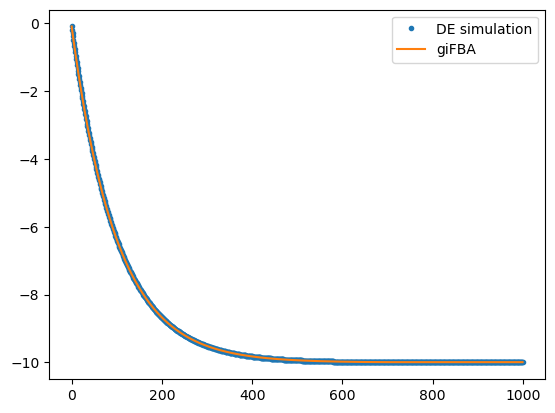

In [6]:
i = EX.index('Ex_A')
print(xs[i,:])
# print(results[i,:,:]) # this can be found by: sum_results / (step_size * rel_abund)
print(sum_results[i,:,:])
plt.plot(sum_results[i,:,0].cumsum(),'.', label='DE simulation')
plt.plot(community.org_fluxes.loc[0,'Ex_A'], label='giFBA')
plt.legend()

## 1b

In [7]:
import gifba

# load models and media:
sim = "1b"
models, media = gifba.utils.load_simple_models(sim)

# initialize community
community = gifba.gifbaObject(models, media, rel_abund=[1], step_size=0.01)

# run iterations
media_flux, org_flux = community.run_gifba(iters=1000, method="pfba", early_stop=False, v=True)

Read LP format model from file /tmp/tmp6j__ounc.lp
Reading time = 0.00 seconds
: 6 rows, 16 columns, 28 nonzeros
Iteration: 0
 Simulating model: 1  of  1
Ex_A [-10.]
Ex_B [-0.]
exchangeBio1 [-0.]
Iteration: 1
 Simulating model: 1  of  1
Ex_A [-9.9]
Ex_B [-0.]
exchangeBio1 [-0.2]
Iteration: 2
 Simulating model: 1  of  1
Ex_A [-9.801]
Ex_B [-0.]
exchangeBio1 [-0.398]
Iteration: 3
 Simulating model: 1  of  1
Ex_A [-9.70299]
Ex_B [-0.]
exchangeBio1 [-0.59402]
Iteration: 4
 Simulating model: 1  of  1
Ex_A [-9.60596]
Ex_B [-0.]
exchangeBio1 [-0.78808]
Iteration: 5
 Simulating model: 1  of  1
Ex_A [-9.5099]
Ex_B [-0.]
exchangeBio1 [-0.980199]
Iteration: 6
 Simulating model: 1  of  1
Ex_A [-9.414801]
Ex_B [-0.]
exchangeBio1 [-1.170397]
Iteration: 7
 Simulating model: 1  of  1
Ex_A [-9.320653]
Ex_B [-0.]
exchangeBio1 [-1.358693]
Iteration: 8
 Simulating model: 1  of  1
Ex_A [-9.227446]
Ex_B [-0.]
exchangeBio1 [-1.545106]
Iteration: 9
 Simulating model: 1  of  1
Ex_A [-9.135172]
Ex_B [-0.]
excha

In [ ]:
# Simulation
rel_abund = [1]
max_substeps = 1000
step_size = 0.01

EX = []
for m in models:
    for exch in m.exchanges:
        EX.append(exch.id)
EX = list(dict.fromkeys(EX))
N_exs = len(EX)
x0 = np.zeros(N_exs)

models = cp.deepcopy(models)

results, sum_results, xs = dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX)

Read LP format model from file /tmp/tmpj70z787w.lp
Reading time = 0.00 seconds
: 6 rows, 16 columns, 28 nonzeros

Step 0 of 1000 -------------------------

Org.  1 :  Ex_A lb:  10.0
Org.  1 :  Ex_B lb:  0.0
Org.  1 :  exchangeBio1 lb:  0.0
----
Internal v for org  1 , exch  Ex_A :  10.0
Internal v for org  1 , exch  Ex_B :  0.0
Internal v for org  1 , exch  exchangeBio1 :  0.0

Step 1 of 1000 -------------------------

Org.  1 :  Ex_A lb:  9.9
Org.  1 :  Ex_B lb:  0.0
Org.  1 :  exchangeBio1 lb:  0.2
----
Internal v for org  1 , exch  Ex_A :  9.9
Internal v for org  1 , exch  Ex_B :  0.0
Internal v for org  1 , exch  exchangeBio1 :  0.2

Step 2 of 1000 -------------------------

Org.  1 :  Ex_A lb:  9.801
Org.  1 :  Ex_B lb:  0.0
Org.  1 :  exchangeBio1 lb:  0.398
----
Internal v for org  1 , exch  Ex_A :  9.801
Internal v for org  1 , exch  Ex_B :  0.0
Internal v for org  1 , exch  exchangeBio1 :  0.398

Step 3 of 1000 -------------------------

Org.  1 :  Ex_A lb:  9.70299
Org.  1 : 

[1.00000000e+01 9.90000000e+00 9.80100000e+00 9.70299000e+00
 9.60596010e+00 9.50990050e+00 9.41480149e+00 9.32065348e+00
 9.22744694e+00 9.13517247e+00 9.04382075e+00 8.95338254e+00
 8.86384872e+00 8.77521023e+00 8.68745813e+00 8.60058355e+00
 8.51457771e+00 8.42943193e+00 8.34513761e+00 8.26168624e+00
 8.17906938e+00 8.09727868e+00 8.01630590e+00 7.93614284e+00
 7.85678141e+00 7.77821359e+00 7.70043146e+00 7.62342714e+00
 7.54719287e+00 7.47172094e+00 7.39700373e+00 7.32303370e+00
 7.24980336e+00 7.17730533e+00 7.10553227e+00 7.03447695e+00
 6.96413218e+00 6.89449086e+00 6.82554595e+00 6.75729049e+00
 6.68971759e+00 6.62282041e+00 6.55659221e+00 6.49102628e+00
 6.42611602e+00 6.36185486e+00 6.29823631e+00 6.23525395e+00
 6.17290141e+00 6.11117240e+00 6.05006067e+00 5.98956006e+00
 5.92966446e+00 5.87036782e+00 5.81166414e+00 5.75354750e+00
 5.69601202e+00 5.63905190e+00 5.58266139e+00 5.52683477e+00
 5.47156642e+00 5.41685076e+00 5.36268225e+00 5.30905543e+00
 5.25596488e+00 5.203405

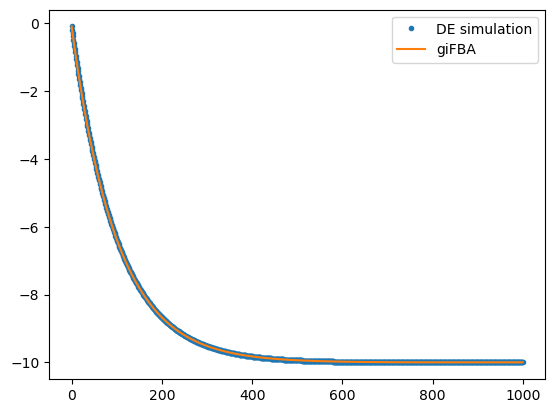

In [13]:
exchange = "Ex_A"
i = EX.index(exchange)
print(xs[i,:])
# print(results[i,:,:]) # this can be found by: sum_results / (step_size * rel_abund)
print(sum_results[i,:,:])
plt.plot(sum_results[i,:,0].cumsum(),'.', label='DE simulation')
plt.plot(community.org_fluxes.loc[0,exchange], label='giFBA')
plt.legend()

## 1c

In [14]:
import gifba

# load models and media:
sim = "1c"
models, media = gifba.utils.load_simple_models(sim)

# initialize community
community = gifba.gifbaObject(models, media, rel_abund=[0.5, 0.5], step_size=0.01)

# run iterations
media_flux, org_flux = community.run_gifba(iters=1000, method="pfba", early_stop=False, v=True)

Read LP format model from file /tmp/tmpzz91_txr.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Read LP format model from file /tmp/tmpu5pn5__b.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Iteration: 0
 Simulating model: 1  of  2
Ex_A [-20.]
exchangeBio1 [-0.]
 Simulating model: 2  of  2
Ex_B [-20.]
exchangeBio2 [-0.]
Iteration: 1
 Simulating model: 1  of  2
Ex_A [-19.8]
exchangeBio1 [-0.2]
 Simulating model: 2  of  2
Ex_B [-19.8]
exchangeBio2 [-0.2]
Iteration: 2
 Simulating model: 1  of  2
Ex_A [-19.602]
exchangeBio1 [-0.398]
 Simulating model: 2  of  2
Ex_B [-19.602]
exchangeBio2 [-0.398]
Iteration: 3
 Simulating model: 1  of  2
Ex_A [-19.40598]
exchangeBio1 [-0.59402]
 Simulating model: 2  of  2
Ex_B [-19.40598]
exchangeBio2 [-0.59402]
Iteration: 4
 Simulating model: 1  of  2
Ex_A [-19.21192]
exchangeBio1 [-0.78808]
 Simulating model: 2  of  2
Ex_B [-19.21192]
exchangeBio2 [-0.78808]
Iteration: 5
 Simulating model: 1  of  2
Ex_A [-19.0198]
exchan

In [ ]:
# Simulation
rel_abund = [0.5, 0.5]
max_substeps = 1000
step_size = 0.01

EX = []
for m in models:
    for exch in m.exchanges:
        EX.append(exch.id)
EX = list(dict.fromkeys(EX))
N_exs = len(EX)
x0 = np.zeros(N_exs)

models = cp.deepcopy(models)

results, sum_results, xs = dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX)

Read LP format model from file /tmp/tmpxjrtf9f2.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Read LP format model from file /tmp/tmpsa1mvhlj.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros

Step 0 of 1000 -------------------------

Org.  1 :  Ex_A lb:  20.0
Org.  1 :  exchangeBio1 lb:  0.0
----
Internal v for org  1 , exch  Ex_A :  10.0
Internal v for org  1 , exch  exchangeBio1 :  0.0

Org.  2 :  Ex_B lb:  20.0
Org.  2 :  exchangeBio2 lb:  0.0
----
Internal v for org  2 , exch  Ex_B :  10.0
Internal v for org  2 , exch  exchangeBio2 :  0.0

Step 1 of 1000 -------------------------

Org.  1 :  Ex_A lb:  19.8
Org.  1 :  exchangeBio1 lb:  0.2
----
Internal v for org  1 , exch  Ex_A :  9.9
Internal v for org  1 , exch  exchangeBio1 :  0.1

Org.  2 :  Ex_B lb:  19.8
Org.  2 :  exchangeBio2 lb:  0.2
----
Internal v for org  2 , exch  Ex_B :  9.9
Internal v for org  2 , exch  exchangeBio2 :  0.1

Step 2 of 1000 -------------------------

Org.  1 :  Ex_A l

[1.00000000e+01 9.90000000e+00 9.80100000e+00 9.70299000e+00
 9.60596010e+00 9.50990050e+00 9.41480149e+00 9.32065348e+00
 9.22744694e+00 9.13517247e+00 9.04382075e+00 8.95338254e+00
 8.86384872e+00 8.77521023e+00 8.68745813e+00 8.60058355e+00
 8.51457771e+00 8.42943193e+00 8.34513761e+00 8.26168624e+00
 8.17906938e+00 8.09727868e+00 8.01630590e+00 7.93614284e+00
 7.85678141e+00 7.77821359e+00 7.70043146e+00 7.62342714e+00
 7.54719287e+00 7.47172094e+00 7.39700373e+00 7.32303370e+00
 7.24980336e+00 7.17730533e+00 7.10553227e+00 7.03447695e+00
 6.96413218e+00 6.89449086e+00 6.82554595e+00 6.75729049e+00
 6.68971759e+00 6.62282041e+00 6.55659221e+00 6.49102628e+00
 6.42611602e+00 6.36185486e+00 6.29823631e+00 6.23525395e+00
 6.17290141e+00 6.11117240e+00 6.05006067e+00 5.98956006e+00
 5.92966446e+00 5.87036782e+00 5.81166414e+00 5.75354750e+00
 5.69601202e+00 5.63905190e+00 5.58266139e+00 5.52683477e+00
 5.47156642e+00 5.41685076e+00 5.36268225e+00 5.30905543e+00
 5.25596488e+00 5.203405

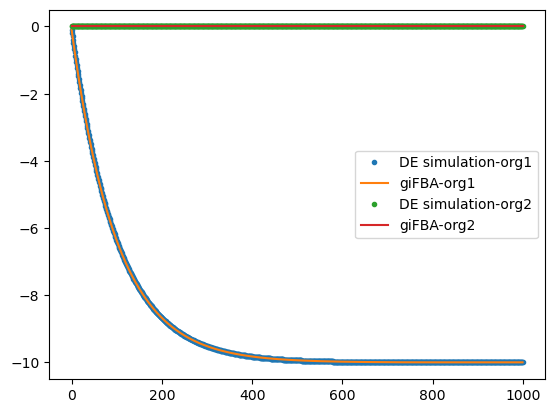

In [17]:
exchange = "Ex_A"
i = EX.index(exchange)
print(xs[i,:])
# print(results[i,:,:]) # this can be found by: sum_results / (step_size * rel_abund)
print(sum_results[i,:,:])
plt.plot(sum_results[i,:,0].cumsum(),'.', label='DE simulation-org1')
plt.plot(community.org_fluxes.loc[0,exchange], label='giFBA-org1')
plt.plot(sum_results[i,:,1].cumsum(),'.', label='DE simulation-org2')
plt.plot(community.org_fluxes.loc[1,exchange], label='giFBA-org2')
plt.legend()

## 2a

In [3]:
import gifba

# load models and media:
sim = "2a"
models, media = gifba.utils.load_simple_models(sim)

# initialize community
community = gifba.gifbaObject(models, media, rel_abund=[0.5, 0.5], step_size=0.01)

# run iterations
media_flux, org_flux = community.run_gifba(iters=1000, method="pfba", early_stop=False, v=True)

Set parameter Username
Set parameter LicenseID to value 2684253
Academic license - for non-commercial use only - expires 2026-07-02
Read LP format model from file /tmp/tmpy3ygw5wp.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Read LP format model from file /tmp/tmp211828k9.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Iteration: 0
 Simulating model: 1  of  2
 Simulating model: 2  of  2
Iteration: 1
 Simulating model: 1  of  2
 Simulating model: 2  of  2
Iteration: 2
 Simulating model: 1  of  2
 Simulating model: 2  of  2
Iteration: 3
 Simulating model: 1  of  2
 Simulating model: 2  of  2
Iteration: 4
 Simulating model: 1  of  2
 Simulating model: 2  of  2
Iteration: 5
 Simulating model: 1  of  2
 Simulating model: 2  of  2
Iteration: 6
 Simulating model: 1  of  2
 Simulating model: 2  of  2
Iteration: 7
 Simulating model: 1  of  2
 Simulating model: 2  of  2
Iteration: 8
 Simulating model: 1  of  2
 Simulating model: 2  of  2
Iteration: 9
 Simulat

In [4]:
# Simulation
rel_abund = [0.5, 0.5]
max_substeps = 1000
step_size = 0.01

EX = []
for m in models:
    for exch in m.exchanges:
        EX.append(exch.id)
EX = list(dict.fromkeys(EX))
N_exs = len(EX)
x0 = np.zeros(N_exs)

models = cp.deepcopy(models)

results, sum_results, xs = dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX)


Step 1 of 1000 -------------------------
Ex_A -10.0
exchangeBio1 10.0
Ex_A -10.0
exchangeBio2 10.0
Converged at step  1


[ 10. -10.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0. 

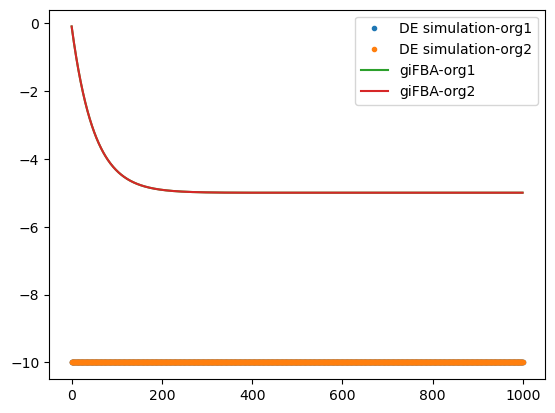

In [5]:
exchange = "Ex_A"
i = EX.index(exchange)
print(xs[i,:])
# print(results[i,:,:]) # this can be found by: sum_results / (step_size * rel_abund)
print(sum_results[i,:,:])
plt.plot(sum_results[i,:,0].cumsum(),'.', label='DE simulation-org1')
plt.plot(sum_results[i,:,1].cumsum(),'.', label='DE simulation-org2')
plt.plot(community.org_fluxes.loc[0,exchange], label='giFBA-org1')
plt.plot(community.org_fluxes.loc[1,exchange], label='giFBA-org2')
plt.legend()

## 2b

In [6]:
import gifba

# load models and media:
sim = "2b"
models, media = gifba.utils.load_simple_models(sim)

# initialize community
community = gifba.gifbaObject(models, media, rel_abund=[0.2, 0.8], step_size=1)

# run iterations
media_flux, org_flux = community.run_gifba(iters=1000, method="pfba", early_stop=True, v=True)

Read LP format model from file /tmp/tmpjz1pztmj.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Read LP format model from file /tmp/tmpq29kre6l.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Iteration: 0
 Simulating model: 1  of  2
Ex_A [-50.]
exchangeBio1 [-0.]
 Simulating model: 2  of  2
Ex_A [-12.5]
exchangeBio2 [-0.]
Ex_A over-consumed by factor of 2.0
 Simulating model: 1  of  2
Ex_A [-10.]
exchangeBio1 [-0.]
 Simulating model: 2  of  2
Ex_A [-10.]
exchangeBio2 [-0.]
Checking Convergence...
Iteration: 1
 Simulating model: 1  of  2
Ex_A [-0.]
exchangeBio1 [-10.]
 Simulating model: 2  of  2
Ex_A [-0.]
exchangeBio2 [-10.]
Checking Convergence...
Converged at iteration 1


In [15]:
community.org_fluxes

,,exchangeBio2,T_A,T_Bio2,BiomassOrg1,Ex_A,BiomassOrg2,exchangeBio1,T_Bio1
Model,Iteration,,,,,,,,
0,0,0.000000,0.020000,0.000000,0.020000,-0.020000,0.000000,0.020000,0.020000
1,0,0.080000,0.080000,0.080000,0.000000,-0.080000,0.080000,0.000000,0.000000
0,1,0.000000,0.039800,0.000000,0.039800,-0.039800,0.000000,0.039800,0.039800
1,1,0.159200,0.159200,0.159200,0.000000,-0.159200,0.159200,0.000000,0.000000
0,2,0.000000,0.059402,0.000000,0.059402,-0.059402,0.000000,0.059402,0.059402
...,...,...,...,...,...,...,...,...,...
1,997,7.993632,7.993632,7.993632,0.000000,-7.993632,7.993632,0.000000,0.000000
0,998,0.000000,2.001907,0.000000,2.001907,-2.001907,0.000000,2.001907,2.001907
1,998,7.993632,7.993632,7.993632,0.000000,-7.993632,7.993632,0.000000,0.000000


In [7]:
# Simulation
rel_abund = [0.2, 0.8]
max_substeps = 1000
step_size = 0.0001

EX = []
for m in models:
    for exch in m.exchanges:
        EX.append(exch.id)
EX = list(dict.fromkeys(EX))
N_exs = len(EX)
x0 = np.zeros(N_exs)

models = cp.deepcopy(models)

results, sum_results, xs = dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX)

Read LP format model from file /tmp/tmprri1ot5h.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Read LP format model from file /tmp/tmph9ga62tm.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros

Step 0 of 1000 -------------------------

Org.  1 :  Ex_A lb:  10000
Org.  1 :  exchangeBio1 lb:  0
----
Internal v for org  1 , exch  Ex_A :  10.0
Internal v for org  1 , exch  exchangeBio1 :  0.0

Org.  2 :  Ex_A lb:  10000
Org.  2 :  exchangeBio2 lb:  0
----
Internal v for org  2 , exch  Ex_A :  10.0
Internal v for org  2 , exch  exchangeBio2 :  0.0

Step 1 of 1000 -------------------------

Org.  1 :  Ex_A lb:  10000
Org.  1 :  exchangeBio1 lb:  10000
----
Internal v for org  1 , exch  Ex_A :  9.9
Internal v for org  1 , exch  exchangeBio1 :  0.02

Org.  2 :  Ex_A lb:  10000
Org.  2 :  exchangeBio2 lb:  10000
----
Internal v for org  2 , exch  Ex_A :  9.9
Internal v for org  2 , exch  exchangeBio2 :  0.08

Step 2 of 1000 -------------------------

Org.  1 :  

[ 1.00000000e+01  9.90000000e+00  9.80000000e+00  9.70000000e+00
  9.60000000e+00  9.50000000e+00  9.40000000e+00  9.30000000e+00
  9.20000000e+00  9.10000000e+00  9.00000000e+00  8.90000000e+00
  8.80000000e+00  8.70000000e+00  8.60000000e+00  8.50000000e+00
  8.40000000e+00  8.30000000e+00  8.20000000e+00  8.10000000e+00
  8.00000000e+00  7.90000000e+00  7.80000000e+00  7.70000000e+00
  7.60000000e+00  7.50000000e+00  7.40000000e+00  7.30000000e+00
  7.20000000e+00  7.10000000e+00  7.00000000e+00  6.90000000e+00
  6.80000000e+00  6.70000000e+00  6.60000000e+00  6.50000000e+00
  6.40000000e+00  6.30000000e+00  6.20000000e+00  6.10000000e+00
  6.00000000e+00  5.90000000e+00  5.80000000e+00  5.70000000e+00
  5.60000000e+00  5.50000000e+00  5.40000000e+00  5.30000000e+00
  5.20000000e+00  5.10000000e+00  5.00000000e+00  4.90000000e+00
  4.80000000e+00  4.70000000e+00  4.60000000e+00  4.50000000e+00
  4.40000000e+00  4.30000000e+00  4.20000000e+00  4.10000000e+00
  4.00000000e+00  3.90000

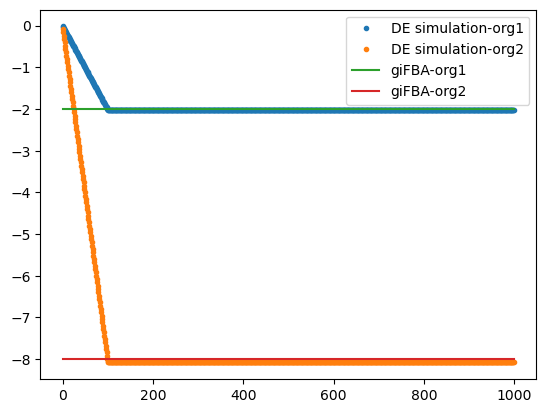

In [8]:
exchange = "Ex_A"
i = EX.index(exchange)
print(xs[i,:])
# print(results[i,:,:]) # this can be found by: sum_results / (step_size * rel_abund)
print(sum_results[i,:,:])
plt.plot(sum_results[i,:,0].cumsum(),'.', label='DE simulation-org1')
plt.plot(sum_results[i,:,1].cumsum(),'.', label='DE simulation-org2')
plt.plot(community.org_fluxes.loc[0,exchange], label='giFBA-org1')
plt.plot(community.org_fluxes.loc[1,exchange], label='giFBA-org2')
plt.legend()

## 2c

In [9]:
import gifba

# load models and media:
sim = "2c"
models, media = gifba.utils.load_simple_models(sim)

# initialize community
community = gifba.gifbaObject(models, media, rel_abund=[0.5, 0.5], step_size=1)

# run iterations
media_flux, org_flux = community.run_gifba(iters=1000, method="pfba", early_stop=True, v=True)

Read LP format model from file /tmp/tmpvf6ifnoy.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Read LP format model from file /tmp/tmp75reg2z2.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros


Iteration: 0
 Simulating model: 1  of  2
Ex_A [-20.]
exchangeBio1 [-0.]
 Simulating model: 2  of  2
Ex_A [-20.]
exchangeBio2 [-0.]
Checking Convergence...
Iteration: 1
 Simulating model: 1  of  2
Ex_A [-10.]
exchangeBio1 [-8.]
 Simulating model: 2  of  2
Ex_A [-10.]
exchangeBio2 [-2.]
Checking Convergence...
Converged at iteration 1


In [10]:
# Simulation
rel_abund = [0.5, 0.5]
max_substeps = 1000
step_size = 0.001

EX = []
for m in models:
    for exch in m.exchanges:
        EX.append(exch.id)
EX = list(dict.fromkeys(EX))
N_exs = len(EX)
x0 = np.zeros(N_exs)

models = cp.deepcopy(models)

results, sum_results, xs = dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX)

Read LP format model from file /tmp/tmphobl9_fa.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Read LP format model from file /tmp/tmp5hjjl2fg.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros

Step 0 of 1000 -------------------------

Org.  1 :  Ex_A lb:  10000
Org.  1 :  exchangeBio1 lb:  0
----
Internal v for org  1 , exch  Ex_A :  10.0
Internal v for org  1 , exch  exchangeBio1 :  0.0

Org.  2 :  Ex_A lb:  10000
Org.  2 :  exchangeBio2 lb:  0
----
Internal v for org  2 , exch  Ex_A :  10.0
Internal v for org  2 , exch  exchangeBio2 :  0.0

Step 1 of 1000 -------------------------

Org.  1 :  Ex_A lb:  10000
Org.  1 :  exchangeBio1 lb:  10000
----
Internal v for org  1 , exch  Ex_A :  9.995000000000001
Internal v for org  1 , exch  exchangeBio1 :  0.004

Org.  2 :  Ex_A lb:  10000
Org.  2 :  exchangeBio2 lb:  10000
----
Internal v for org  2 , exch  Ex_A :  9.995000000000001
Internal v for org  2 , exch  exchangeBio2 :  0.001

Step 2 of 1000 --------

[10.     9.995  9.99   9.985  9.98   9.975  9.97   9.965  9.96   9.955
  9.95   9.945  9.94   9.935  9.93   9.925  9.92   9.915  9.91   9.905
  9.9    9.895  9.89   9.885  9.88   9.875  9.87   9.865  9.86   9.855
  9.85   9.845  9.84   9.835  9.83   9.825  9.82   9.815  9.81   9.805
  9.8    9.795  9.79   9.785  9.78   9.775  9.77   9.765  9.76   9.755
  9.75   9.745  9.74   9.735  9.73   9.725  9.72   9.715  9.71   9.705
  9.7    9.695  9.69   9.685  9.68   9.675  9.67   9.665  9.66   9.655
  9.65   9.645  9.64   9.635  9.63   9.625  9.62   9.615  9.61   9.605
  9.6    9.595  9.59   9.585  9.58   9.575  9.57   9.565  9.56   9.555
  9.55   9.545  9.54   9.535  9.53   9.525  9.52   9.515  9.51   9.505
  9.5    9.495  9.49   9.485  9.48   9.475  9.47   9.465  9.46   9.455
  9.45   9.445  9.44   9.435  9.43   9.425  9.42   9.415  9.41   9.405
  9.4    9.395  9.39   9.385  9.38   9.375  9.37   9.365  9.36   9.355
  9.35   9.345  9.34   9.335  9.33   9.325  9.32   9.315  9.31   9.305
  9.3 

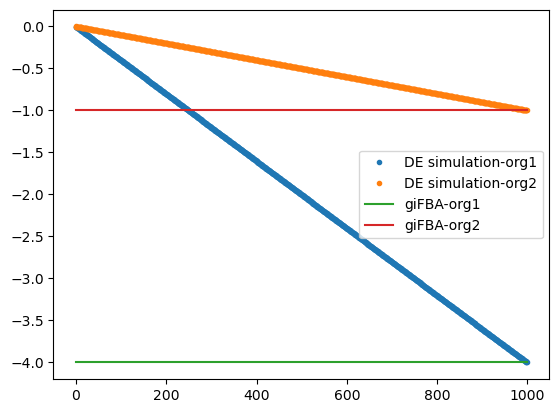

In [11]:
exchange = "Ex_A"
i = EX.index(exchange)
print(xs[i,:])
# print(results[i,:,:]) # this can be found by: sum_results / (step_size * rel_abund)
print(sum_results[i,:,:])
plt.plot(sum_results[i,:,0].cumsum(),'.', label='DE simulation-org1')
plt.plot(sum_results[i,:,1].cumsum(),'.', label='DE simulation-org2')
plt.plot(community.org_fluxes.loc[0,exchange], label='giFBA-org1')
plt.plot(community.org_fluxes.loc[1,exchange], label='giFBA-org2')
plt.legend()

## 2d

In [13]:
import gifba

# load models and media:
sim = "2d"
models, media = gifba.utils.load_simple_models(sim)

# initialize community
community = gifba.gifbaObject(models, media, rel_abund=[0.5, 0.5], step_size=0.01)

# run iterations
media_flux, org_flux = community.run_gifba(iters=1000, method="pfba", early_stop=False, v=True)

Read LP format model from file /tmp/tmpuvffszzw.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Read LP format model from file /tmp/tmp08q74uuw.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Iteration: 0
 Simulating model: 1  of  2
Ex_A [-20.]
exchangeBio1 [-0.]
 Simulating model: 2  of  2
Ex_A [-20.]
exchangeBio2 [-0.]
Iteration: 1
 Simulating model: 1  of  2
Ex_A [-19.717158]
exchangeBio1 [-0.226274]
 Simulating model: 2  of  2
Ex_A [-19.717158]
exchangeBio2 [-0.056568]
Iteration: 2
 Simulating model: 1  of  2
Ex_A [-19.438316]
exchangeBio1 [-0.449348]
 Simulating model: 2  of  2
Ex_A [-19.438316]
exchangeBio2 [-0.112336]
Iteration: 3
 Simulating model: 1  of  2
Ex_A [-19.163416]
exchangeBio1 [-0.669268]
 Simulating model: 2  of  2
Ex_A [-19.163416]
exchangeBio2 [-0.167316]
Iteration: 4
 Simulating model: 1  of  2
Ex_A [-18.892404]
exchangeBio1 [-0.886078]
 Simulating model: 2  of  2
Ex_A [-18.892404]
exchangeBio2 [-0.221518]
Iteration: 5
 Simulatin

In [ ]:
# Simulation
rel_abund = [0.5, 0.5]
max_substeps = 1000
step_size = 0.01

EX = []
for m in models:
    for exch in m.exchanges:
        EX.append(exch.id)
EX = list(dict.fromkeys(EX))
N_exs = len(EX)
x0 = np.zeros(N_exs)

models = cp.deepcopy(models)

results, sum_results, xs = dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX)

Read LP format model from file /tmp/tmpcpomdbuh.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Read LP format model from file /tmp/tmp2hmtbzzt.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros

Step 0 of 1000 -------------------------

Org.  1 :  Ex_A lb:  20.0
Org.  1 :  exchangeBio1 lb:  0.0
----
Internal v for org  1 , exch  Ex_A :  10.0
Internal v for org  1 , exch  exchangeBio1 :  0.0

Org.  2 :  Ex_A lb:  20.0
Org.  2 :  exchangeBio2 lb:  0.0
----
Internal v for org  2 , exch  Ex_A :  10.0
Internal v for org  2 , exch  exchangeBio2 :  0.0

Step 1 of 1000 -------------------------

Org.  1 :  Ex_A lb:  19.8
Org.  1 :  exchangeBio1 lb:  0.16
----
Internal v for org  1 , exch  Ex_A :  9.9
Internal v for org  1 , exch  exchangeBio1 :  0.08

Org.  2 :  Ex_A lb:  19.8
Org.  2 :  exchangeBio2 lb:  0.04
----
Internal v for org  2 , exch  Ex_A :  9.9
Internal v for org  2 , exch  exchangeBio2 :  0.02

Step 2 of 1000 -------------------------

Org.  1 :  Ex

[1.00000000e+01 9.90000000e+00 9.80000000e+00 9.70000000e+00
 9.60000000e+00 9.50000000e+00 9.40000000e+00 9.30000000e+00
 9.20000000e+00 9.10000000e+00 9.00000000e+00 8.90000000e+00
 8.80000000e+00 8.70000000e+00 8.60000000e+00 8.50000000e+00
 8.40000000e+00 8.30000000e+00 8.20000000e+00 8.10000000e+00
 8.00000000e+00 7.90000000e+00 7.80100000e+00 7.70299000e+00
 7.60596010e+00 7.50990050e+00 7.41480149e+00 7.32065348e+00
 7.22744694e+00 7.13517247e+00 7.04382075e+00 6.95338254e+00
 6.86384872e+00 6.77521023e+00 6.68745813e+00 6.60058355e+00
 6.51457771e+00 6.42943193e+00 6.34513761e+00 6.26168624e+00
 6.17906938e+00 6.09727868e+00 6.01630590e+00 5.93614284e+00
 5.85678141e+00 5.77821359e+00 5.70043146e+00 5.62342714e+00
 5.54719287e+00 5.47172094e+00 5.39700373e+00 5.32303370e+00
 5.24980336e+00 5.17730533e+00 5.10553227e+00 5.03447695e+00
 4.96413218e+00 4.89449086e+00 4.82554595e+00 4.75729049e+00
 4.68971759e+00 4.62282041e+00 4.55659221e+00 4.49102628e+00
 4.42611602e+00 4.361854

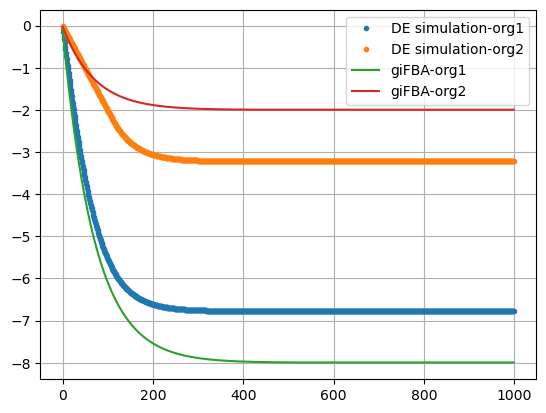

In [17]:
exchange = "Ex_A"
i = EX.index(exchange)
print(xs[i,:])
# print(results[i,:,:]) # this can be found by: sum_results / (step_size * rel_abund)
print(sum_results[i,:,:])
plt.plot(sum_results[i,:,0].cumsum(),'.', label='DE simulation-org1')
plt.plot(sum_results[i,:,1].cumsum(),'.', label='DE simulation-org2')
plt.plot(community.org_fluxes.loc[0,exchange], label='giFBA-org1')
plt.plot(community.org_fluxes.loc[1,exchange], label='giFBA-org2')
plt.legend()
plt.grid()

## 2e

In [18]:
import gifba

# load models and media:
sim = "2e"
models, media = gifba.utils.load_simple_models(sim)

# initialize community
community = gifba.gifbaObject(models, media, rel_abund=[0.5, 0.5], step_size=0.01)

# run iterations
media_flux, org_flux = community.run_gifba(iters=1000, method="pfba", early_stop=False, v=True)

Read LP format model from file /tmp/tmpxotdfmyd.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Read LP format model from file /tmp/tmpd_sd0lhp.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Iteration: 0
 Simulating model: 1  of  2
Ex_A [-20.]
exchangeBio1 [-0.]
 Simulating model: 2  of  2
Ex_A [-20.]
exchangeBio2 [-0.]
Iteration: 1
 Simulating model: 1  of  2
Ex_A [-19.92929]
exchangeBio1 [-0.056568]
 Simulating model: 2  of  2
Ex_A [-19.92929]
exchangeBio2 [-0.014142]
Iteration: 2
 Simulating model: 1  of  2
Ex_A [-19.85958]
exchangeBio1 [-0.112336]
 Simulating model: 2  of  2
Ex_A [-19.85958]
exchangeBio2 [-0.028084]
Iteration: 3
 Simulating model: 1  of  2
Ex_A [-19.790856]
exchangeBio1 [-0.167316]
 Simulating model: 2  of  2
Ex_A [-19.790856]
exchangeBio2 [-0.041828]
Iteration: 4
 Simulating model: 1  of  2
Ex_A [-19.723104]
exchangeBio1 [-0.221518]
 Simulating model: 2  of  2
Ex_A [-19.723104]
exchangeBio2 [-0.055378]
Iteration: 5
 Simulating mo

In [ ]:
# Simulation
rel_abund = [0.5, 0.5]
max_substeps = 1000
step_size = 0.01

EX = []
for m in models:
    for exch in m.exchanges:
        EX.append(exch.id)
EX = list(dict.fromkeys(EX))
N_exs = len(EX)
x0 = np.zeros(N_exs)

models = cp.deepcopy(models)

results, sum_results, xs = dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX)

Read LP format model from file /tmp/tmp9lk5l9j1.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros
Read LP format model from file /tmp/tmp9togd60n.lp
Reading time = 0.00 seconds
: 4 rows, 10 columns, 16 nonzeros

Step 0 of 1000 -------------------------

Org.  1 :  Ex_A lb:  20.0
Org.  1 :  exchangeBio1 lb:  0.0
----
Internal v for org  1 , exch  Ex_A :  10.0
Internal v for org  1 , exch  exchangeBio1 :  0.0

Org.  2 :  Ex_A lb:  20.0
Org.  2 :  exchangeBio2 lb:  0.0
----
Internal v for org  2 , exch  Ex_A :  10.0
Internal v for org  2 , exch  exchangeBio2 :  0.0

Step 1 of 1000 -------------------------

Org.  1 :  Ex_A lb:  19.95
Org.  1 :  exchangeBio1 lb:  0.04
----
Internal v for org  1 , exch  Ex_A :  9.975
Internal v for org  1 , exch  exchangeBio1 :  0.02

Org.  2 :  Ex_A lb:  19.95
Org.  2 :  exchangeBio2 lb:  0.01
----
Internal v for org  2 , exch  Ex_A :  9.975
Internal v for org  2 , exch  exchangeBio2 :  0.005

Step 2 of 1000 -------------------------

Org.  

[1.00000000e+01 9.97500000e+00 9.95000000e+00 9.92500000e+00
 9.90000000e+00 9.87500000e+00 9.85000000e+00 9.82500000e+00
 9.80000000e+00 9.77500000e+00 9.75000000e+00 9.72500000e+00
 9.70000000e+00 9.67500000e+00 9.65000000e+00 9.62500000e+00
 9.60000000e+00 9.57500000e+00 9.55000000e+00 9.52500000e+00
 9.50000000e+00 9.47500000e+00 9.45000000e+00 9.42500000e+00
 9.40000000e+00 9.37500000e+00 9.35000000e+00 9.32500000e+00
 9.30000000e+00 9.27500000e+00 9.25000000e+00 9.22500000e+00
 9.20000000e+00 9.17500000e+00 9.15000000e+00 9.12500000e+00
 9.10000000e+00 9.07500000e+00 9.05000000e+00 9.02500000e+00
 9.00000000e+00 8.97500000e+00 8.95000000e+00 8.92500000e+00
 8.90000000e+00 8.87500000e+00 8.85000000e+00 8.82500000e+00
 8.80000000e+00 8.77500000e+00 8.75000000e+00 8.72500000e+00
 8.70000000e+00 8.67500000e+00 8.65000000e+00 8.62500000e+00
 8.60000000e+00 8.57500000e+00 8.55000000e+00 8.52500000e+00
 8.50000000e+00 8.47500000e+00 8.45000000e+00 8.42500000e+00
 8.40000000e+00 8.375000

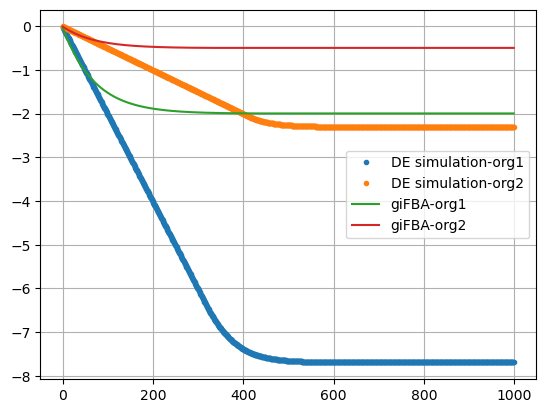

In [21]:
exchange = "Ex_A"
i = EX.index(exchange)
print(xs[i,:])
# print(results[i,:,:]) # this can be found by: sum_results / (step_size * rel_abund)
print(sum_results[i,:,:])
plt.plot(sum_results[i,:,0].cumsum(),'.', label='DE simulation-org1')
plt.plot(sum_results[i,:,1].cumsum(),'.', label='DE simulation-org2')
plt.plot(community.org_fluxes.loc[0,exchange], label='giFBA-org1')
plt.plot(community.org_fluxes.loc[1,exchange], label='giFBA-org2')
plt.legend()
plt.grid()

## 3a

In [22]:
import gifba

# load models and media:
sim = "3a"
models, media = gifba.utils.load_simple_models(sim)

# initialize community
community = gifba.gifbaObject(models, media, rel_abund=[0.5, 0.5], step_size=0.01)

# run iterations
media_flux, org_flux = community.run_gifba(iters=1000, method="pfba", early_stop=False, v=True)

Read LP format model from file /tmp/tmpoht1iuwc.lp
Reading time = 0.00 seconds
: 6 rows, 16 columns, 26 nonzeros
Read LP format model from file /tmp/tmpyn2u574q.lp
Reading time = 0.00 seconds
: 6 rows, 14 columns, 24 nonzeros
Iteration: 0
 Simulating model: 1  of  2
Ex_A [-20.]
Ex_B [-0.]
exchangeBio1 [-0.]
 Simulating model: 2  of  2
Ex_C [-20.]
Ex_B [-0.]
exchangeBio2 [-0.]
Iteration: 1
 Simulating model: 1  of  2
Ex_A [-19.717158]
Ex_B [-0.282842]
exchangeBio1 [-0.282842]
 Simulating model: 2  of  2
Ex_C [-19.717158]
Ex_B [-0.282842]
exchangeBio2 [-0.282842]
Iteration: 2
 Simulating model: 1  of  2
Ex_A [-19.438316]
Ex_B [-0.557684]
exchangeBio1 [-0.565684]
 Simulating model: 2  of  2
Ex_C [-19.438316]
Ex_B [-0.557684]
exchangeBio2 [-0.561684]
Iteration: 3
 Simulating model: 1  of  2
Ex_A [-19.163416]
Ex_B [-0.824696]
exchangeBio1 [-0.84847]
 Simulating model: 2  of  2
Ex_C [-19.163416]
Ex_B [-0.824696]
exchangeBio2 [-0.836584]
Iteration: 4
 Simulating model: 1  of  2
Ex_A [-18.8924

In [ ]:
# Simulation
rel_abund = [0.5, 0.5]
max_substeps = 1000
step_size = 0.01

EX = []
for m in models:
    for exch in m.exchanges:
        EX.append(exch.id)
EX = list(dict.fromkeys(EX))
N_exs = len(EX)
x0 = np.zeros(N_exs)

models = cp.deepcopy(models)

results, sum_results, xs = dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX)

Read LP format model from file /tmp/tmpum33m9by.lp
Reading time = 0.00 seconds
: 6 rows, 16 columns, 26 nonzeros
Read LP format model from file /tmp/tmp8cuqgwer.lp
Reading time = 0.00 seconds
: 6 rows, 14 columns, 24 nonzeros

Step 0 of 1000 -------------------------

Org.  1 :  Ex_A lb:  20.0
Org.  1 :  Ex_B lb:  0.0
Org.  1 :  exchangeBio1 lb:  0.0
----
Internal v for org  1 , exch  Ex_A :  10.0
Internal v for org  1 , exch  Ex_B :  0.0
Internal v for org  1 , exch  exchangeBio1 :  0.0

Org.  2 :  Ex_B lb:  0.0
Org.  2 :  Ex_C lb:  20.0
Org.  2 :  exchangeBio2 lb:  0.0
----
Internal v for org  2 , exch  Ex_C :  10.0
Internal v for org  2 , exch  Ex_B :  0.0
Internal v for org  2 , exch  exchangeBio2 :  0.0

Step 1 of 1000 -------------------------

Org.  1 :  Ex_A lb:  19.8
Org.  1 :  Ex_B lb:  0.2
Org.  1 :  exchangeBio1 lb:  0.2
----
Internal v for org  1 , exch  Ex_A :  9.9
Internal v for org  1 , exch  Ex_B :  0.1
Internal v for org  1 , exch  exchangeBio1 :  0.1

Org.  2 :  Ex_B

[1.00000000e+01 9.90000000e+00 9.80100000e+00 9.70299000e+00
 9.60596010e+00 9.50990050e+00 9.41480149e+00 9.32065348e+00
 9.22744694e+00 9.13517247e+00 9.04382075e+00 8.95338254e+00
 8.86384872e+00 8.77521023e+00 8.68745813e+00 8.60058355e+00
 8.51457771e+00 8.42943193e+00 8.34513761e+00 8.26168624e+00
 8.17906938e+00 8.09727868e+00 8.01630590e+00 7.93614284e+00
 7.85678141e+00 7.77821359e+00 7.70043146e+00 7.62342714e+00
 7.54719287e+00 7.47172094e+00 7.39700373e+00 7.32303370e+00
 7.24980336e+00 7.17730533e+00 7.10553227e+00 7.03447695e+00
 6.96413218e+00 6.89449086e+00 6.82554595e+00 6.75729049e+00
 6.68971759e+00 6.62282041e+00 6.55659221e+00 6.49102628e+00
 6.42611602e+00 6.36185486e+00 6.29823631e+00 6.23525395e+00
 6.17290141e+00 6.11117240e+00 6.05006067e+00 5.98956006e+00
 5.92966446e+00 5.87036782e+00 5.81166414e+00 5.75354750e+00
 5.69601202e+00 5.63905190e+00 5.58266139e+00 5.52683477e+00
 5.47156642e+00 5.41685076e+00 5.36268225e+00 5.30905543e+00
 5.25596488e+00 5.203405

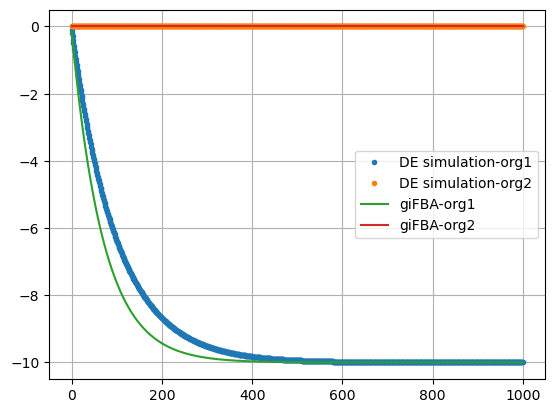

In [25]:
exchange = "Ex_A"
i = EX.index(exchange)
print(xs[i,:])
# print(results[i,:,:]) # this can be found by: sum_results / (step_size * rel_abund)
print(sum_results[i,:,:])
plt.plot(sum_results[i,:,0].cumsum(),'.', label='DE simulation-org1')
plt.plot(sum_results[i,:,1].cumsum(),'.', label='DE simulation-org2')
plt.plot(community.org_fluxes.loc[0,exchange], label='giFBA-org1')
plt.plot(community.org_fluxes.loc[1,exchange], label='giFBA-org2')
plt.legend()
plt.grid()

## 3b

In [26]:
import gifba

# load models and media:
sim = "3b"
models, media = gifba.utils.load_simple_models(sim)

# initialize community
community = gifba.gifbaObject(models, media, rel_abund=[0.5, 0.5], step_size=0.01)

# run iterations
media_flux, org_flux = community.run_gifba(iters=1000, method="pfba", early_stop=False, v=True)

Read LP format model from file /tmp/tmpqqbtbyal.lp
Reading time = 0.00 seconds
: 10 rows, 24 columns, 42 nonzeros
Read LP format model from file /tmp/tmpm0ebm5j2.lp
Reading time = 0.00 seconds
: 10 rows, 24 columns, 40 nonzeros
Iteration: 0
 Simulating model: 1  of  2
Ex_A [-20.]
Ex_B [-0.]
Ex_C [-0.]
Ex_D [-0.]
exchangeBio1 [-0.]
 Simulating model: 2  of  2
Ex_A [-20.]
Ex_B [-0.]
Ex_C [-0.]
Ex_D [-0.]
exchangeBio2 [-0.]
Iteration: 1
 Simulating model: 1  of  2
Ex_A [-19.717158]
Ex_B [-0.282842]
Ex_C [-0.]
Ex_D [-0.]
exchangeBio1 [-0.282842]
 Simulating model: 2  of  2
Ex_A [-19.717158]
Ex_B [-0.282842]
Ex_C [-0.]
Ex_D [-0.]
exchangeBio2 [-0.]
Iteration: 2
 Simulating model: 1  of  2
Ex_A [-19.438316]
Ex_B [-0.557684]
Ex_C [-0.004]
Ex_D [-0.]
exchangeBio1 [-0.561684]
 Simulating model: 2  of  2
Ex_A [-19.438316]
Ex_B [-0.557684]
Ex_C [-0.004]
Ex_D [-0.]
exchangeBio2 [-0.004]
Iteration: 3
 Simulating model: 1  of  2
Ex_A [-19.163416]
Ex_B [-0.824696]
Ex_C [-0.01183]
Ex_D [-5.6e-05]
exch

In [ ]:
# Simulation
rel_abund = [0.5, 0.5]
max_substeps = 1000
step_size = 0.01

EX = []
for m in models:
    for exch in m.exchanges:
        EX.append(exch.id)
EX = list(dict.fromkeys(EX))
N_exs = len(EX)
x0 = np.zeros(N_exs)

models = cp.deepcopy(models)

results, sum_results, xs = dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX)

Read LP format model from file /tmp/tmp5s_ceayp.lp
Reading time = 0.00 seconds
: 10 rows, 24 columns, 42 nonzeros
Read LP format model from file /tmp/tmppd6fas8e.lp
Reading time = 0.00 seconds
: 10 rows, 24 columns, 40 nonzeros

Step 0 of 1000 -------------------------

Org.  1 :  Ex_A lb:  20.0
Org.  1 :  Ex_B lb:  0.0
Org.  1 :  Ex_C lb:  0.0
Org.  1 :  Ex_D lb:  0.0
Org.  1 :  exchangeBio1 lb:  0.0
----
Internal v for org  1 , exch  Ex_A :  10.0
Internal v for org  1 , exch  Ex_B :  0.0
Internal v for org  1 , exch  Ex_C :  0.0
Internal v for org  1 , exch  Ex_D :  0.0
Internal v for org  1 , exch  exchangeBio1 :  0.0

Org.  2 :  Ex_A lb:  20.0
Org.  2 :  Ex_B lb:  0.0
Org.  2 :  Ex_C lb:  0.0
Org.  2 :  Ex_D lb:  0.0
Org.  2 :  exchangeBio2 lb:  0.0
----
Internal v for org  2 , exch  Ex_A :  10.0
Internal v for org  2 , exch  Ex_B :  0.0
Internal v for org  2 , exch  Ex_C :  0.0
Internal v for org  2 , exch  Ex_D :  0.0
Internal v for org  2 , exch  exchangeBio2 :  0.0

Step 1 of 1

[1.00000000e+01 9.90000000e+00 9.80100000e+00 9.70299000e+00
 9.60596010e+00 9.50990050e+00 9.41480149e+00 9.32065348e+00
 9.22744694e+00 9.13517247e+00 9.04382075e+00 8.95338254e+00
 8.86384872e+00 8.77521023e+00 8.68745813e+00 8.60058355e+00
 8.51457771e+00 8.42943193e+00 8.34513761e+00 8.26168624e+00
 8.17906938e+00 8.09727868e+00 8.01630590e+00 7.93614284e+00
 7.85678141e+00 7.77821359e+00 7.70043146e+00 7.62342714e+00
 7.54719287e+00 7.47172094e+00 7.39700373e+00 7.32303370e+00
 7.24980336e+00 7.17730533e+00 7.10553227e+00 7.03447695e+00
 6.96413218e+00 6.89449086e+00 6.82554595e+00 6.75729049e+00
 6.68971759e+00 6.62282041e+00 6.55659221e+00 6.49102628e+00
 6.42611602e+00 6.36185486e+00 6.29823631e+00 6.23525395e+00
 6.17290141e+00 6.11117240e+00 6.05006067e+00 5.98956006e+00
 5.92966446e+00 5.87036782e+00 5.81166414e+00 5.75354750e+00
 5.69601202e+00 5.63905190e+00 5.58266139e+00 5.52683477e+00
 5.47156642e+00 5.41685076e+00 5.36268225e+00 5.30905543e+00
 5.25596488e+00 5.203405

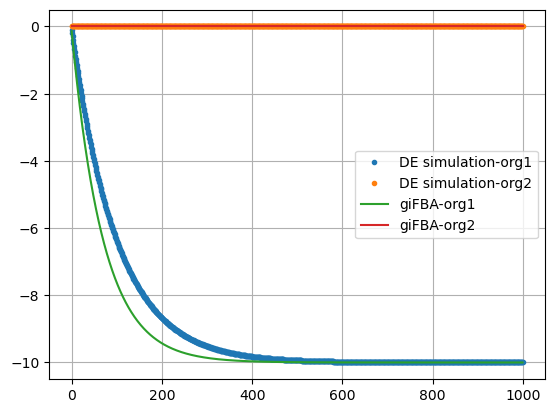

In [32]:
exchange = "Ex_A"
i = EX.index(exchange)
print(xs[i,:])
# print(results[i,:,:]) # this can be found by: sum_results / (step_size * rel_abund)
print(sum_results[i,:,:])
plt.plot(sum_results[i,:,0].cumsum(),'.', label='DE simulation-org1')
plt.plot(sum_results[i,:,1].cumsum(),'.', label='DE simulation-org2')
plt.plot(community.org_fluxes.loc[0,exchange], label='giFBA-org1')
plt.plot(community.org_fluxes.loc[1,exchange], label='giFBA-org2')
plt.legend()
plt.grid()

## 3c

In [33]:
import gifba

# load models and media:
sim = "3c"
models, media = gifba.utils.load_simple_models(sim)

# initialize community
community = gifba.gifbaObject(models, media, rel_abund=[0.5, 0.5], step_size=0.01)

# run iterations
media_flux, org_flux = community.run_gifba(iters=1000, method="pfba", early_stop=False, v=True)

Read LP format model from file /tmp/tmpjri1ty4j.lp
Reading time = 0.00 seconds
: 6 rows, 14 columns, 24 nonzeros
Read LP format model from file /tmp/tmpsxtu_3th.lp
Reading time = 0.00 seconds
: 6 rows, 16 columns, 26 nonzeros
Iteration: 0
 Simulating model: 1  of  2
Ex_A [-20.]
Ex_B [-0.]
exchangeBio1 [-0.]
 Simulating model: 2  of  2
Ex_A [-20.]
Ex_B [-0.]
exchangeBio2 [-0.]
Iteration: 1
 Simulating model: 1  of  2
Ex_A [-19.434314]
Ex_B [-0.282842]
exchangeBio1 [-0.282842]
 Simulating model: 2  of  2
Ex_A [-19.434314]
Ex_B [-0.282842]
exchangeBio2 [-0.282842]
Iteration: 2
 Simulating model: 1  of  2
Ex_A [-18.884628]
Ex_B [-0.553684]
exchangeBio1 [-0.557684]
 Simulating model: 2  of  2
Ex_A [-18.884628]
Ex_B [-0.553684]
exchangeBio2 [-0.561684]
Iteration: 3
 Simulating model: 1  of  2
Ex_A [-18.35049]
Ex_B [-0.812922]
exchangeBio1 [-0.824752]
 Simulating model: 2  of  2
Ex_A [-18.35049]
Ex_B [-0.812922]
exchangeBio2 [-0.836584]
Iteration: 4
 Simulating model: 1  of  2
Ex_A [-17.83146

In [ ]:
# Simulation
rel_abund = [0.5, 0.5]
max_substeps = 1000
step_size = 0.01

EX = []
for m in models:
    for exch in m.exchanges:
        EX.append(exch.id)
EX = list(dict.fromkeys(EX))
N_exs = len(EX)
x0 = np.zeros(N_exs)

models = cp.deepcopy(models)

results, sum_results, xs = dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX)

Read LP format model from file /tmp/tmpu9s44mon.lp
Reading time = 0.00 seconds
: 6 rows, 14 columns, 24 nonzeros
Read LP format model from file /tmp/tmpfcdysm0t.lp
Reading time = 0.00 seconds
: 6 rows, 16 columns, 26 nonzeros

Step 0 of 1000 -------------------------

Org.  1 :  Ex_A lb:  20.0
Org.  1 :  Ex_B lb:  0.0
Org.  1 :  exchangeBio1 lb:  0.0
----
Internal v for org  1 , exch  Ex_A :  10.0
Internal v for org  1 , exch  Ex_B :  0.0
Internal v for org  1 , exch  exchangeBio1 :  0.0

Org.  2 :  Ex_A lb:  20.0
Org.  2 :  Ex_B lb:  0.0
Org.  2 :  exchangeBio2 lb:  0.0
----
Internal v for org  2 , exch  Ex_A :  10.0
Internal v for org  2 , exch  Ex_B :  0.0
Internal v for org  2 , exch  exchangeBio2 :  0.0

Step 1 of 1000 -------------------------

Org.  1 :  Ex_A lb:  19.6
Org.  1 :  Ex_B lb:  0.2
Org.  1 :  exchangeBio1 lb:  0.2
----
Internal v for org  1 , exch  Ex_A :  9.8
Internal v for org  1 , exch  Ex_B :  0.1
Internal v for org  1 , exch  exchangeBio1 :  0.1

Org.  2 :  Ex_A

[1.00000000e+01 9.80000000e+00 9.60400000e+00 9.41192000e+00
 9.22368160e+00 9.03920797e+00 8.85842381e+00 8.68125533e+00
 8.50763023e+00 8.33747762e+00 8.17072807e+00 8.00731351e+00
 7.84716724e+00 7.69022389e+00 7.53641941e+00 7.38569103e+00
 7.23797721e+00 7.09321766e+00 6.95135331e+00 6.81232624e+00
 6.67607972e+00 6.54255812e+00 6.41170696e+00 6.28347282e+00
 6.15780337e+00 6.03464730e+00 5.91395435e+00 5.79567526e+00
 5.67976176e+00 5.56616652e+00 5.45484319e+00 5.34574633e+00
 5.23883140e+00 5.13405478e+00 5.03137368e+00 4.93074621e+00
 4.83213128e+00 4.73548866e+00 4.64077888e+00 4.54796331e+00
 4.45700404e+00 4.36786396e+00 4.28050668e+00 4.19489655e+00
 4.11099862e+00 4.02877864e+00 3.94820307e+00 3.86923901e+00
 3.79185423e+00 3.71601714e+00 3.64169680e+00 3.56886286e+00
 3.49748561e+00 3.42753590e+00 3.35898518e+00 3.29180547e+00
 3.22596936e+00 3.16144998e+00 3.09822098e+00 3.03625656e+00
 2.97553143e+00 2.91602080e+00 2.85770038e+00 2.80054637e+00
 2.74453545e+00 2.689644

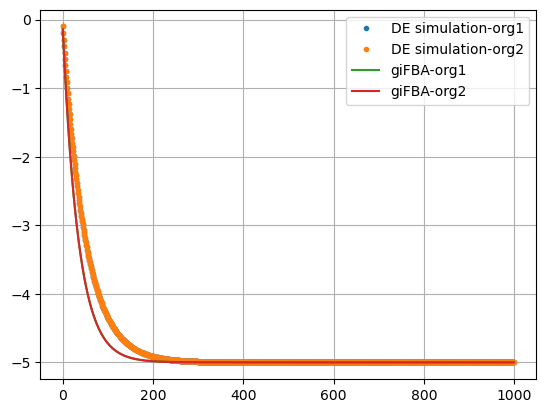

In [35]:
exchange = "Ex_A"
i = EX.index(exchange)
print(xs[i,:])
# print(results[i,:,:]) # this can be found by: sum_results / (step_size * rel_abund)
print(sum_results[i,:,:])
plt.plot(sum_results[i,:,0].cumsum(),'.', label='DE simulation-org1')
plt.plot(sum_results[i,:,1].cumsum(),'.', label='DE simulation-org2')
plt.plot(community.org_fluxes.loc[0,exchange], label='giFBA-org1')
plt.plot(community.org_fluxes.loc[1,exchange], label='giFBA-org2')
plt.legend()
plt.grid()

## 4a

In [ ]:
import gifba

# load models and media:
sim = "4a"
models, media = gifba.utils.load_simple_models(sim)

# initialize community
community = gifba.gifbaObject(models, media, rel_abund=[0.5, 0.5], step_size=0.01)

# run iterations
media_flux, org_flux = community.run_gifba(iters=1000, method="pfba", early_stop=False, v=True)

Set parameter Username
Set parameter LicenseID to value 2684253
Academic license - for non-commercial use only - expires 2026-07-02
Read LP format model from file /tmp/tmpzijpt3ka.lp
Reading time = 0.00 seconds
: 8 rows, 20 columns, 32 nonzeros
Read LP format model from file /tmp/tmpon8z1u8u.lp
Reading time = 0.00 seconds
: 6 rows, 16 columns, 26 nonzeros
Iteration: 0
 Simulating model: 1  of  2
Ex_A [-20.]
Ex_B [-20.]
Ex_C [-0.]
exchangeBio1 [-0.]
 Simulating model: 2  of  2
Ex_C [-0.]
Ex_D [-20.]
exchangeBio2 [-0.]
Iteration: 1
 Simulating model: 1  of  2
Ex_A [-19.9]
Ex_B [-20.]
Ex_C [-0.]
exchangeBio1 [-0.1]
 Simulating model: 2  of  2
Ex_C [-0.]
Ex_D [-19.9]
exchangeBio2 [-0.1]
Iteration: 2
 Simulating model: 1  of  2
Ex_A [-19.8005]
Ex_B [-20.]
Ex_C [-0.]
exchangeBio1 [-0.1995]
 Simulating model: 2  of  2
Ex_C [-0.]
Ex_D [-19.8005]
exchangeBio2 [-0.1995]
Iteration: 3
 Simulating model: 1  of  2
Ex_A [-19.701498]
Ex_B [-20.]
Ex_C [-0.]
exchangeBio1 [-0.298502]
 Simulating model: 2

In [ ]:
# Simulation
rel_abund = [0.5, 0.5]
max_substeps = 1000
step_size = 0.01

EX = []
for m in models:
    for exch in m.exchanges:
        EX.append(exch.id)
EX = list(dict.fromkeys(EX))
N_exs = len(EX)
x0 = np.zeros(N_exs)

models = cp.deepcopy(models)

results, sum_results, xs = dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX)

Read LP format model from file /tmp/tmprz3zsdwq.lp
Reading time = 0.00 seconds
: 8 rows, 20 columns, 32 nonzeros
Read LP format model from file /tmp/tmpq0mbyc7c.lp
Reading time = 0.00 seconds
: 6 rows, 16 columns, 26 nonzeros

Step 0 of 1000 -------------------------

Org.  1 :  Ex_A lb:  20.0
Org.  1 :  Ex_B lb:  20.0
Org.  1 :  Ex_C lb:  0.0
Org.  1 :  exchangeBio1 lb:  0.0
----
Internal v for org  1 , exch  Ex_A :  10.0
Internal v for org  1 , exch  Ex_B :  10.0
Internal v for org  1 , exch  Ex_C :  0.0
Internal v for org  1 , exch  exchangeBio1 :  0.0

Org.  2 :  Ex_C lb:  0.0
Org.  2 :  Ex_D lb:  20.0
Org.  2 :  exchangeBio2 lb:  0.0
----
Internal v for org  2 , exch  Ex_C :  0.0
Internal v for org  2 , exch  Ex_D :  10.0
Internal v for org  2 , exch  exchangeBio2 :  0.0

Step 1 of 1000 -------------------------

Org.  1 :  Ex_A lb:  19.8
Org.  1 :  Ex_B lb:  20.0
Org.  1 :  Ex_C lb:  0.0
Org.  1 :  exchangeBio1 lb:  0.2
----
Internal v for org  1 , exch  Ex_A :  9.9
Internal v fo

[1.00000000e+01 9.90000000e+00 9.80100000e+00 9.70299000e+00
 9.60596010e+00 9.50990050e+00 9.41480149e+00 9.32065348e+00
 9.22744694e+00 9.13517247e+00 9.04382075e+00 8.95338254e+00
 8.86384872e+00 8.77521023e+00 8.68745813e+00 8.60058355e+00
 8.51457771e+00 8.42943193e+00 8.34513761e+00 8.26168624e+00
 8.17906938e+00 8.09727868e+00 8.01630590e+00 7.93614284e+00
 7.85678141e+00 7.77821359e+00 7.70043146e+00 7.62342714e+00
 7.54719287e+00 7.47172094e+00 7.39700373e+00 7.32303370e+00
 7.24980336e+00 7.17730533e+00 7.10553227e+00 7.03447695e+00
 6.96413218e+00 6.89449086e+00 6.82554595e+00 6.75729049e+00
 6.68971759e+00 6.62282041e+00 6.55659221e+00 6.49102628e+00
 6.42611602e+00 6.36185486e+00 6.29823631e+00 6.23525395e+00
 6.17290141e+00 6.11117240e+00 6.05006067e+00 5.98956006e+00
 5.92966446e+00 5.87036782e+00 5.81166414e+00 5.75354750e+00
 5.69601202e+00 5.63905190e+00 5.58266139e+00 5.52683477e+00
 5.47156642e+00 5.41685076e+00 5.36268225e+00 5.30905543e+00
 5.25596488e+00 5.203405

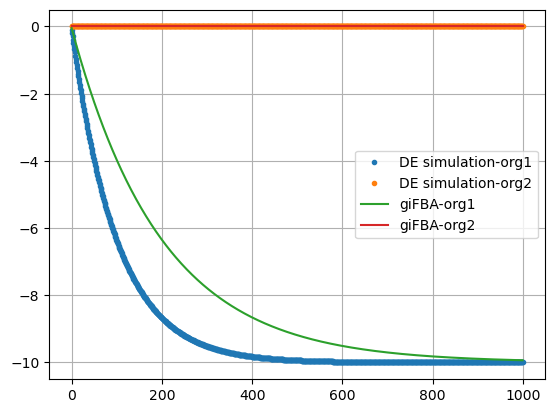

In [5]:
exchange = "Ex_A"
i = EX.index(exchange)
print(xs[i,:])
# print(results[i,:,:]) # this can be found by: sum_results / (step_size * rel_abund)
print(sum_results[i,:,:])
plt.plot(sum_results[i,:,0].cumsum(),'.', label='DE simulation-org1')
plt.plot(sum_results[i,:,1].cumsum(),'.', label='DE simulation-org2')
plt.plot(community.org_fluxes.loc[0,exchange], label='giFBA-org1')
plt.plot(community.org_fluxes.loc[1,exchange], label='giFBA-org2')
plt.legend()
plt.grid()

## test

In [48]:
import gifba
rel_abund = [0.8, 0.2]
iters=1000
step_size=0.0001

# load models and media:
sim = "test"
models, media = gifba.utils.load_simple_models(sim)

# initialize community
community = gifba.gifbaObject(models, media, rel_abund=rel_abund, step_size=1)

# run iterations
media_flux, org_flux = community.run_gifba(iters=iters, method="pfba", early_stop=True, v=True)

Read LP format model from file /tmp/tmpncvwqbk1.lp
Reading time = 0.00 seconds
: 6 rows, 14 columns, 24 nonzeros
Read LP format model from file /tmp/tmpvsjmjkx0.lp
Reading time = 0.00 seconds
: 6 rows, 14 columns, 24 nonzeros
Iteration: 0
 Simulating model: 1  of  2
Ex_A [-12.5]
Ex_C [-0.]
exchangeBio1 [-0.]
 Simulating model: 2  of  2
Ex_C [-0.]
Ex_A [-50.]
exchangeBio2 [-0.]
Checking Convergence...
Iteration: 1
 Simulating model: 1  of  2
Ex_A [-0.]
Ex_C [-12.5]
exchangeBio1 [-12.5]
 Simulating model: 2  of  2
Ex_C [-50.]
Ex_A [-0.]
exchangeBio2 [-0.]
Checking Convergence...
Converged at iteration 1


In [49]:
# Simulation
max_substeps = iters

EX = []
for m in models:
    for exch in m.exchanges:
        EX.append(exch.id)
EX = list(dict.fromkeys(EX))
N_exs = len(EX)
x0 = np.zeros(N_exs)

models = cp.deepcopy(models)

results, sum_results, xs = dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX)

Read LP format model from file /tmp/tmp1r1lmkat.lp
Reading time = 0.00 seconds
: 6 rows, 14 columns, 24 nonzeros
Read LP format model from file /tmp/tmpbrdnbq5y.lp
Reading time = 0.00 seconds
: 6 rows, 14 columns, 24 nonzeros

Step 0 of 1000 -------------------------

Org.  1 :  Ex_A lb:  100000
Org.  1 :  Ex_C lb:  0
Org.  1 :  exchangeBio1 lb:  0
----
Internal v for org  1 , exch  Ex_A :  10.0
Internal v for org  1 , exch  Ex_C :  0.0
Internal v for org  1 , exch  exchangeBio1 :  0.0

Org.  2 :  Ex_A lb:  100000
Org.  2 :  Ex_C lb:  0
Org.  2 :  exchangeBio2 lb:  0
----
Internal v for org  2 , exch  Ex_C :  0.0
Internal v for org  2 , exch  Ex_A :  10.0
Internal v for org  2 , exch  exchangeBio2 :  0.0

Step 1 of 1000 -------------------------

Org.  1 :  Ex_A lb:  100000
Org.  1 :  Ex_C lb:  100000
Org.  1 :  exchangeBio1 lb:  100000
----
Internal v for org  1 , exch  Ex_A :  9.92
Internal v for org  1 , exch  Ex_C :  0.08
Internal v for org  1 , exch  exchangeBio1 :  0.08

Org.  2 

[-8.08 -2.  ] sum results:  -10.08
[ 8.08 -2.  ] sum results:  6.08
Model  Iteration
0      999         -10.0
1      999           0.0
Name: Ex_A, dtype: float64


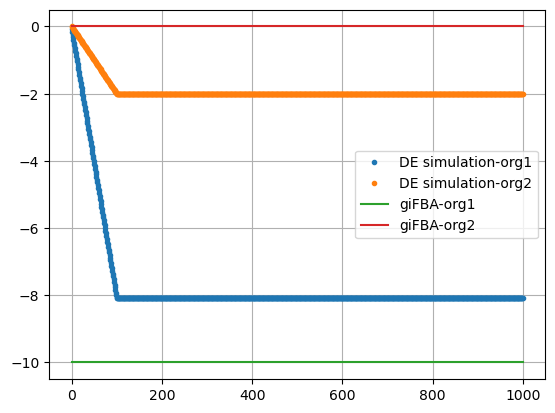

In [50]:
exchange = "Ex_A"
i = EX.index(exchange)
# print(xs[i,:])
# print(results[i,:,:]) # this can be found by: sum_results / (step_size * rel_abund)
# print(sum_results[i,:,:])
plt.plot(sum_results[i,:,0].cumsum(),'.', label='DE simulation-org1')
plt.plot(sum_results[i,:,1].cumsum(),'.', label='DE simulation-org2')
plt.plot(community.org_fluxes.loc[0,exchange], label='giFBA-org1')
plt.plot(community.org_fluxes.loc[1,exchange], label='giFBA-org2')
plt.legend()
plt.grid()

print(sum_results[i,:,:].sum(axis=0), "sum results: ", sum_results[i, :, :].sum())
i = EX.index("Ex_C")
print(sum_results[i,:,:].sum(axis=0), "sum results: ", sum_results[i, :, :].sum())
print(org_flux.loc[:,exchange])

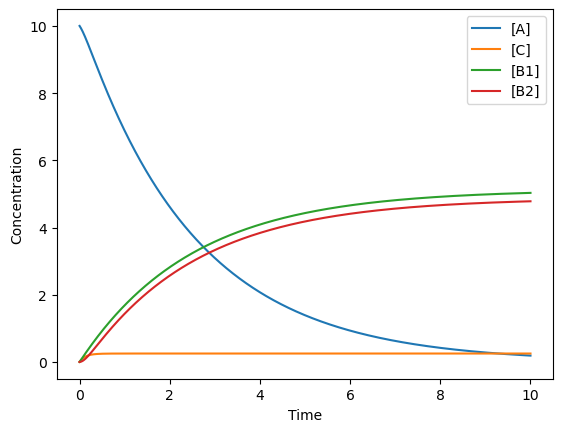

In [22]:
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt

# Define rate constants
k1 = .2  # Rate constant for Reaction 1
k2 = .8  # Rate constant for Reaction 2

# Define the ODE system for mass-action kinetics
def model(concentrations, t):
    A, C, B1, B2 = concentrations

    # Reaction rates
    v1 = k1 * A
    v2 = k2 * A * C

    # ODEs
    dA_dt = -v1 - v2 # Consumption of A in both reactions
    dC_dt = v1 - v2 # produce C in reaction 1, consume in reaction 2
    dB1_dt = v1 # Production of B1 from Reaction 1
    dB2_dt = v2 # Production of B2 from Reaction 2

    return [dA_dt, dC_dt, dB1_dt, dB2_dt]

# Initial concentrations
A0 = 10  # Initial concentration of A
C0 = 0.0  # Initial concentration of C
B1_0 = 0.0  # Initial concentration of B1
B2_0 = 0.0  # Initial concentration of B2
initial_conditions = [A0, C0, B1_0, B2_0]

# Time points to solve over
t = np.linspace(0, 10, 1000)

# Solve ODEs
results = odeint(model, initial_conditions, t)
A, C, B1, B2 = results.T

# Plot results
plt.plot(t, A, label="[A]")
plt.plot(t, C, label="[C]")
plt.plot(t, B1, label="[B1]")
plt.plot(t, B2, label="[B2]")
plt.xlabel("Time")
plt.ylabel("Concentration")
plt.legend()
plt.show()

# test2


In [3]:
import gifba
rel_abund = [0.5, 0.5]
iters=1000
step_size=0.01

# load models and media:
sim = "test2"
models, media = gifba.utils.load_simple_models(sim)

# initialize community
community = gifba.gifbaObject(models, media, rel_abund=rel_abund, step_size=step_size)

# run iterations
media_flux, org_flux = community.run_gifba(iters=iters, method="pfba", early_stop=True, v=True)

Set parameter Username
Set parameter LicenseID to value 2684253
Academic license - for non-commercial use only - expires 2026-07-02
Read LP format model from file /tmp/tmp67kyczbh.lp
Reading time = 0.00 seconds
: 6 rows, 14 columns, 24 nonzeros
Read LP format model from file /tmp/tmpqy1iow0b.lp
Reading time = 0.00 seconds
: 7 rows, 20 columns, 34 nonzeros
Iteration: 0
 Simulating model: 1  of  2
Ex_C [-0.]
Ex_D [-20.]
exchangeBio1 [-0.]
 Simulating model: 2  of  2
Ex_C [-0.]
Ex_A [-20.]
exchangeBio2 [-0.]
Checking Convergence...
Iteration: 1
 Simulating model: 1  of  2
Ex_C [-0.1]
Ex_D [-19.9]
exchangeBio1 [-0.1]
 Simulating model: 2  of  2
Ex_C [-0.1]
Ex_A [-19.9]
exchangeBio2 [-0.1]
Checking Convergence...
Iteration: 2
 Simulating model: 1  of  2
Ex_C [-0.199]
Ex_D [-19.8005]
exchangeBio1 [-0.1995]
 Simulating model: 2  of  2
Ex_C [-0.199]
Ex_A [-19.8005]
exchangeBio2 [-0.2]
Checking Convergence...
Iteration: 3
 Simulating model: 1  of  2
Ex_C [-0.297008]
Ex_D [-19.701498]
exchangeBi

In [4]:
# Simulation
max_substeps = iters

EX = []
for m in models:
    for exch in m.exchanges:
        EX.append(exch.id)
EX = list(dict.fromkeys(EX))
N_exs = len(EX)
x0 = np.zeros(N_exs)

models = cp.deepcopy(models)

results, sum_results, xs = dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX)

Read LP format model from file /tmp/tmpky5vzokj.lp
Reading time = 0.00 seconds
: 6 rows, 14 columns, 24 nonzeros
Read LP format model from file /tmp/tmpq4jlrtyi.lp
Reading time = 0.00 seconds
: 7 rows, 20 columns, 34 nonzeros

Step 0 of 1000 -------------------------

Org.  1 :  Ex_C lb:  0.0
Org.  1 :  Ex_D lb:  20.0
Org.  1 :  exchangeBio1 lb:  0.0
----
Internal v for org  1 , exch  Ex_C :  0.0
Internal v for org  1 , exch  Ex_D :  10.0
Internal v for org  1 , exch  exchangeBio1 :  0.0

Org.  2 :  Ex_C lb:  0.0
Org.  2 :  Ex_A lb:  20.0
Org.  2 :  exchangeBio2 lb:  0.0
----
Internal v for org  2 , exch  Ex_C :  0.0
Internal v for org  2 , exch  Ex_A :  10.0
Internal v for org  2 , exch  exchangeBio2 :  0.0

Step 1 of 1000 -------------------------

Org.  1 :  Ex_C lb:  0.2
Org.  1 :  Ex_D lb:  19.8
Org.  1 :  exchangeBio1 lb:  0.2
----
Internal v for org  1 , exch  Ex_C :  0.1
Internal v for org  1 , exch  Ex_D :  9.9
Internal v for org  1 , exch  exchangeBio1 :  0.1

Org.  2 :  Ex_C

[9.99956829 0.        ] sum results:  9.999568287525893
[ 0.         19.99477584] sum results:  19.994775842990098
                 exchangeBio1  exchangeBio2
Model Iteration                            
0     999            9.933471      0.000000
1     999            0.000000     19.532567


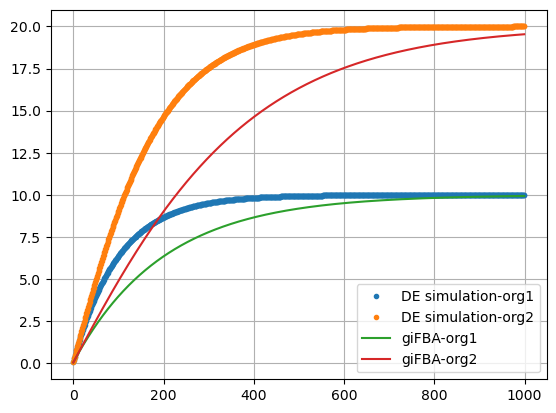

In [5]:
exchange1 = "exchangeBio1"
i_1 = EX.index(exchange1)

exchange2 = "exchangeBio2"
i_2 = EX.index(exchange2)
# print(xs[i,:])
# print(results[i,:,:]) # this can be found by: sum_results / (step_size * rel_abund)
# print(sum_results[i,:,:])
plt.plot(sum_results[i_1,:,0].cumsum(),'.', label='DE simulation-org1')
plt.plot(sum_results[i_2,:,1].cumsum(),'.', label='DE simulation-org2')
plt.plot(community.org_fluxes.loc[0,exchange1], label='giFBA-org1')
plt.plot(community.org_fluxes.loc[1,exchange2], label='giFBA-org2')
plt.legend()
plt.grid()

print(sum_results[i_1,:,:].sum(axis=0), "sum results: ", sum_results[i_1, :, :].sum())
print(sum_results[i_2,:,:].sum(axis=0), "sum results: ", sum_results[i_2, :, :].sum())
print(org_flux.loc[:,[exchange1, exchange2]])

In [9]:
community.org_fluxes

,,Ex_D,T_Bio2,T_C,Ex_A,T_A,Biomass1,exchangeBio2,Ex_C,exchangeBio1,Biomass2,T_D,T_Bio1
Model,Iteration,,,,,,,,,,,,
0,0,-0.050000,0.000000,-0.050000,0.000000,0.000000,0.050000,0.000000,0.050000,0.050000,0.000000,-0.050000,0.050000
1,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
0,1,-0.099750,0.000000,-0.099750,0.000000,0.000000,0.099750,0.000000,0.099750,0.099750,0.000000,-0.099750,0.099750
1,1,0.000000,0.000250,0.000250,-0.000250,-0.000250,0.000000,0.000250,-0.000250,0.000000,0.000250,0.000000,0.000000
0,2,-0.149251,0.000000,-0.149251,0.000000,0.000000,0.149251,0.000000,0.149251,0.149251,0.000000,-0.149251,0.149251
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1,997,0.000000,9.595732,9.595732,-9.595732,-9.595732,0.000000,9.595732,-9.595732,0.000000,9.595732,0.000000,0.000000
0,998,-9.933137,0.000000,-9.933137,0.000000,0.000000,9.933137,0.000000,9.933137,9.933137,0.000000,-9.933137,9.933137
1,998,0.000000,9.597417,9.597417,-9.597417,-9.597417,0.000000,9.597417,-9.597417,0.000000,9.597417,0.000000,0.000000


# real models


In [1]:
import cobra as cb
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import copy as cp
from IPython.display import clear_output

m1 = cb.io.load_matlab_model('AGORA2_Models/Bifidobacterium_longum_infantis_ATCC_15697.mat')
m2 = cb.io.load_matlab_model('AGORA2_Models/Eubacterium_hallii_DSM_3353.mat')

M = [m1, m2]

# Define Media

# AGORA Format
media = {
	'EX_o2(e)': 0, #aerobic/anaerobic
	'EX_h2o(e)': -1000,
	'EX_pi(e)': -1000,
	'EX_fe2(e)': -1000,
	'EX_fe3(e)': -1000,
	'EX_zn2(e)': -1000,
	'EX_so4(e)': -1000,
	'EX_cu2(e)': -1000,
	'EX_k(e)': -1000,
	'EX_mg2(e)': -1000,
	'EX_mn2(e)': -1000,
	'EX_cd2(e)': -1000,
	'EX_cl(e)': -1000,
	'EX_ca2(e)': -1000,
	'EX_cobalt2(e)': -1000,
	'EX_glc_D(e)': -10,
	'EX_nh4(e)': -20,

	'EX_ribflv(e)': -1000,
	'EX_pnto_R(e)': -1000,
	'EX_nac(e)': -1000,
	'EX_his_L(e)': -1000,
	'EX_asn_L(e)': -1000,
	'EX_glycys(e)': -1000,

	'EX_lys_L(e)': -1000,
	'EX_ala_L(e)': -1000,
	'EX_met_L(e)': -1000,
	'EX_leu_L(e)': -1000,
	'EX_hxan(e)': -1000,    
    'EX_glyglu(e)': -1000
	# 'EX_ser_L(e)': -1 #-1
}


Set parameter Username
Set parameter LicenseID to value 2684253
Academic license - for non-commercial use only - expires 2026-07-02


No defined compartments in model model. Compartments will be deduced heuristically using regular expressions.
Using regular expression found the following compartments:c, e
No defined compartments in model model. Compartments will be deduced heuristically using regular expressions.
Using regular expression found the following compartments:c, e


In [2]:
# Simulation
rel_abund = [0.5, 0.5]
step_size=0.00005
max_substeps = 1000

EX = []
for m in M:
    for exch in m.exchanges:
        EX.append(exch.id)
EX = list(dict.fromkeys(EX))
N_exs = len(EX)
x0 = np.zeros(N_exs)

models = cp.deepcopy(M)

# results, sum_results, xs = dynamic_simulation(max_substeps, step_size, models, rel_abund, media, EX)

Read LP format model from file /tmp/tmpxnib6x0p.lp
Reading time = 0.00 seconds
: 932 rows, 2064 columns, 8440 nonzeros
Read LP format model from file /tmp/tmp7jy4d0rv.lp
Reading time = 0.00 seconds
: 980 rows, 2102 columns, 8980 nonzeros


In [3]:
import gifba
rel_abund = [0.5, 0.5]
iters=1000
step_size=1

# initialize community
community = gifba.gifbaObject(M, media, rel_abund=rel_abund, step_size=step_size)

# run iterations
media_flux, org_flux = community.run_gifba(iters=iters, method="pfba", early_stop=True, v=True)

Read LP format model from file /tmp/tmp12le0er7.lp
Reading time = 0.00 seconds
: 932 rows, 2064 columns, 8440 nonzeros
Read LP format model from file /tmp/tmpr3347dj_.lp
Reading time = 0.00 seconds
: 980 rows, 2102 columns, 8980 nonzeros
Iteration: 0
 Simulating model: 1  of  2
EX_12ppd_S(e) [-0.]
EX_4abut(e) [-0.]
EX_4abz(e) [-0.]
EX_4ahmmp(e) [-0.]
EX_5mthf(e) [-0.]
EX_C02528(e) [-0.]
EX_HC02191(e) [-0.]
EX_HC02192(e) [-0.]
EX_HC02193(e) [-0.]
EX_M01989(e) [-0.]
EX_M03134(e) [-0.]
EX_Ser_Thr(e) [-0.]
EX_T_antigen(e) [-0.]
EX_Tn_antigen(e) [-0.]
EX_ac(e) [-0.]
EX_acald(e) [-0.]
EX_acgal(e) [-0.]
EX_acgam(e) [-0.]
EX_acnam(e) [-0.]
EX_adocbl(e) [-0.]
EX_alaasp(e) [-0.]
EX_alagln(e) [-0.]
EX_alaglu(e) [-0.]
EX_alagly(e) [-0.]
EX_alahis(e) [-0.]
EX_alaleu(e) [-0.]
EX_alathr(e) [-0.]
EX_arab_L(e) [-0.]
EX_arabinogal(e) [-0.]
EX_arabttr(e) [-0.]
EX_arbt(e) [-0.]
EX_asn_L(e) [-2000.]
EX_biomass(e) [-0.]
EX_btn(e) [-0.]
EX_butam(e) [-0.]
EX_ca2(e) [-2000.]
EX_cbl1(e) [-0.]
EX_cd2(e) [-2000.]

In [12]:
import gifba
rel_abund = [0.5, 0.5]
iters=1000
step_size=1

# initialize community
community = gifba.gifbaObject(M, [media, .1], rel_abund=rel_abund, step_size=step_size)
community.media
print(M[1])
print(M[1].metabolites.get_by_id("glyglu[e]").name)
# run iterations
# media_flux, org_flux = community.run_gifba(iters=iters, method="pfba", early_stop=True, v=True)

Read LP format model from file /tmp/tmpqb__y2_h.lp
Reading time = 0.00 seconds
: 932 rows, 2064 columns, 8440 nonzeros
Read LP format model from file /tmp/tmp5nt3g_st.lp
Reading time = 0.00 seconds
: 980 rows, 2102 columns, 8980 nonzeros
model
Glycyl-L-glutamate


/home/rseag/UVM/M3_Lab/giFBA/package/gifba/utils.py:82: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  min_medium = pd.concat(min_medium, axis=1).fillna(0)


[0.06458693 0.27963872] sum results:  0.344225651031857
[0.06458693 0.27963872] sum results:  0.344225651031857
                 EX_biomass(e)  EX_biomass(e)
Model Iteration                              
0     999             0.066768       0.066768
1     999             0.314854       0.314854
[[0.00035293 0.00111314]
 [0.00070587 0.00265277]
 [0.0010588  0.0041924 ]
 ...
 [0.06458693 0.27963872]
 [0.06458693 0.27963872]
 [0.06458693 0.27963872]]
[[0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]]


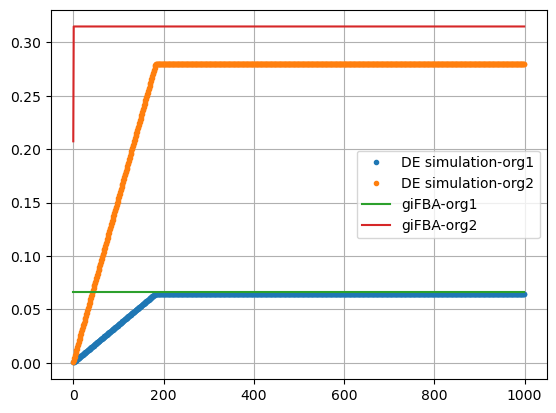

In [ ]:
exchange = "EX_biomass(e)"
i = EX.index(exchange)
# print(xs[i,:])
# print(results[i,:,:]) # this can be found by: sum_results / (step_size * rel_abund)
# print(sum_results[i,:,:])
plt.plot(sum_results[i,:,0].cumsum(),'.', label='DE simulation-org1')
plt.plot(sum_results[i,:,1].cumsum(),'.', label='DE simulation-org2')
plt.plot(community.org_fluxes.loc[0,exchange], label='giFBA-org1')
plt.plot(community.org_fluxes.loc[1,exchange], label='giFBA-org2')
plt.legend()
plt.grid()

print(sum_results[i,:,:].sum(axis=0), "sum results: ", sum_results[i, :, :].sum())
print(sum_results[i,:,:].sum(axis=0), "sum results: ", sum_results[i, :, :].sum())
print(org_flux.loc[:,[exchange, exchange]])

print(sum_results[i,:,:].cumsum(axis=0))
i = EX.index("EX_ser_L(e)")
print(sum_results[i,:10,:].cumsum(axis=0))

#### serine messing with this
with serine = -1: gifba = 0.059, 0.294 (2 iter)

with serine = -1000: gifba = 0.059, 5.090 (1 iter)

with serine = 0: gifba = 0.119, 0 (1 iter)

In [8]:
print(xs.shape)
print(len(EX))

(188, 1000)
188


In [8]:
xs_df = pd.DataFrame(xs.T, columns=EX)
xs_df

,EX_12ppd_S(e),EX_4abut(e),EX_4abz(e),EX_4ahmmp(e),EX_5mthf(e),EX_C02528(e),EX_HC02191(e),EX_HC02192(e),EX_HC02193(e),EX_M01989(e),...,EX_nchlphncl(e),EX_nmn(e),EX_nzp(e),EX_pcresol(e),EX_ppa(e),EX_ptrc(e),EX_rbflvrd(e),EX_sbt_D(e),EX_ser_L(e),EX_spmd(e)
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.919287,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.838575,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.757862,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.677149,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [ ]:
community.org_fluxes[xs_df_no0.columns]


,,EX_ac(e),EX_asn_L(e),EX_biomass(e),EX_ca2(e),EX_cd2(e),EX_cl(e),EX_co2(e),EX_cobalt2(e),EX_cu2(e),EX_etoh(e),...,EX_pi(e),EX_pnto_R(e),EX_ribflv(e),EX_so4(e),EX_zn2(e),EX_ala_L(e),EX_but(e),EX_h2(e),EX_lys_L(e),EX_ser_L(e)
Model,Iteration,,,,,,,,,,,,,,,,,,,,,
0,0,0.000000e+00,-0.014047,0.059857,-0.000467,0.0,-0.000467,0.519541,-0.000467,-0.000467,0.370223,...,-0.088592,-0.000935,-0.000935,-0.000467,-0.000467,0.000000,0.000000,0.000000,0.000000,0.0
1,0,3.432036e+00,-0.047610,0.202871,-0.001584,0.0,-0.001584,7.888157,-0.001584,-0.001584,0.000000,...,-0.291031,0.000000,0.000000,-0.001584,-0.001584,-0.135638,2.725766,10.600184,-0.067668,-1.0
0,1,0.000000e+00,-0.014047,0.059857,-0.000467,0.0,-0.000467,0.519541,-0.000467,-0.000467,0.370223,...,-0.088592,-0.000935,-0.000935,-0.000467,-0.000467,0.000000,0.000000,0.000000,0.000000,0.0
1,1,4.341160e-08,-0.069189,0.294822,-0.002302,0.0,-0.002302,17.195844,-0.002302,-0.002302,0.000000,...,-0.422940,0.000000,0.000000,-0.002302,-0.002302,-0.197116,8.396526,16.602741,-0.098338,-1.0
0,2,0.000000e+00,-0.014047,0.059857,-0.000467,0.0,-0.000467,0.519541,-0.000467,-0.000467,0.370223,...,-0.088592,-0.000935,-0.000935,-0.000467,-0.000467,0.000000,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1,997,4.341160e-08,-0.069189,0.294822,-0.002302,0.0,-0.002302,17.195844,-0.002302,-0.002302,0.000000,...,-0.422940,0.000000,0.000000,-0.002302,-0.002302,-0.197116,8.396526,16.602741,-0.098338,-1.0
0,998,0.000000e+00,-0.014047,0.059857,-0.000467,0.0,-0.000467,0.519541,-0.000467,-0.000467,0.370223,...,-0.088592,-0.000935,-0.000935,-0.000467,-0.000467,0.000000,0.000000,0.000000,0.000000,0.0
1,998,4.341160e-08,-0.069189,0.294822,-0.002302,0.0,-0.002302,17.195844,-0.002302,-0.002302,0.000000,...,-0.422940,0.000000,0.000000,-0.002302,-0.002302,-0.197116,8.396526,16.602741,-0.098338,-1.0


In [ ]:
community.env_fluxes#.loc[:, (community.env_fluxes < 0).any(axis=0)]#[xs_df_no0.columns]
# h, ac, lac, for <- all made in iter 1 and consumed in iter 2

,EX_ppi(e),EX_glu_L(e),EX_spmd(e),EX_5mthf(e),EX_Tn_antigen(e),EX_pydx(e),EX_C02528(e),EX_sT_antigen(e),EX_ca2(e),EX_f1a(e),...,EX_tdchola(e),EX_arabttr(e),EX_malttr(e),EX_drib(e),EX_pro_L(e),EX_mnl(e),EX_malt(e),EX_core7(e),EX_glcur(e),EX_M01989(e)
Iteration,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,999.997948,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,999.997230,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,999.997230,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,999.997230,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,999.997230,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,999.997230,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,999.997230,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
xs_df_no0 = xs_df.loc[:, (xs_df != 0).any(axis=0)] 
xs_df_no0

,EX_ac(e),EX_asn_L(e),EX_biomass(e),EX_ca2(e),EX_cd2(e),EX_cl(e),EX_co2(e),EX_cobalt2(e),EX_cu2(e),EX_etoh(e),...,EX_pi(e),EX_pnto_R(e),EX_ribflv(e),EX_so4(e),EX_zn2(e),EX_ala_L(e),EX_but(e),EX_h2(e),EX_lys_L(e),EX_ser_L(e)
0,0.000000,1000.000000,0.000000,1000.000000,1000.0,1000.000000,0.000000,1000.000000,1000.000000,0.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,0.000000,0.000000,1000.000000,1.000000
1,0.019728,999.999574,0.001814,999.999986,1000.0,999.999986,0.054081,999.999986,999.999986,0.003268,...,999.997383,999.999995,999.999995,999.999986,999.999986,999.999005,0.030899,0.030798,999.999504,0.959644
2,0.039456,999.999149,0.003628,999.999972,1000.0,999.999972,0.108093,999.999972,999.999972,0.006396,...,999.994766,999.999990,999.999990,999.999972,999.999972,999.998010,0.061798,0.061596,999.999007,0.919287
3,0.059184,999.998723,0.005442,999.999958,1000.0,999.999958,0.162105,999.999958,999.999958,0.009524,...,999.992149,999.999985,999.999985,999.999958,999.999958,999.997016,0.092697,0.092394,999.998511,0.878931
4,0.078912,999.998297,0.007255,999.999943,1000.0,999.999943,0.216117,999.999943,999.999943,0.012652,...,999.989532,999.999980,999.999980,999.999943,999.999943,999.996021,0.123596,0.123193,999.998015,0.838575
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
996,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
997,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
998,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
